# Imports

In [1]:
import airr
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import numpy as np
import pandas as pd
import seaborn as sns

import sys
sys.path.append('/mnt/md0/s236922/cowell-lab/repertoire_zoo/')
import repertoire_zoo.bird as br
import repertoire_zoo.giraffe as gr


/home/s236922/apps/miniconda3/envs/zoo/lib/python3.13/site-packages/airr/schema.py:10: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream


# Setup Data Directories

In [2]:
# '/mnt/md0/Projects/MonsonLab/COVVAX/vdjserver/a9803592-eaa3-47b5-ac99-d91e8a1434fc-007' <- initial groups defined
# '/mnt/md0/Projects/MonsonLab/COVVAX/vdjserver/1a011c26-48a1-4a2d-8dce-47faa65e1b8b-007' <- more groups

project_id='c0aef9ef-362d-46fd-abba-39ac0945bd66'
job_id='1a011c26-48a1-4a2d-8dce-47faa65e1b8b-007'

data_dir = '/mnt/md0/Projects/MonsonLab/COVVAX/'
repcalc_dir = data_dir + 'vdjserver/'+job_id+'/'
analysis_dir = data_dir + 'analysis/'
fig_dir = analysis_dir + 'figures/'

# Read in Data

In [3]:
sample_info_df = br.read_repertoire_info_airr(repcalc_dir + 'repertoires.airr.json')
repertoire_group_df = br.read_repertoire_group_info_airr(repcalc_dir + 'repertoires.airr.json')

data = airr.read_airr(repcalc_dir + 'repertoires.airr.json')
# pull out repertoires and names
repertoire_groups = { obj['repertoire_group_id'] : obj for obj in data['RepertoireGroup'] }

groups = [
    (repertoire_group_df.loc[i,'repertoire_group_id'], repertoire_group_df.loc[i,'name'], len(repertoire_group_df.loc[i,'repertoires'])) 
    for i in range(len(repertoire_group_df))
]

for rep_group_id in repertoire_groups:
    print(rep_group_id, repertoire_groups[rep_group_id]['repertoire_group_name'])



Total Number of Repertoire Groups:  22
b08f9f20-8770-42e2-a785-ff9443b6edb6 High Neutralization
167ecf28-c395-40ed-9651-a7ef7d0784cb Low Neutralization
ad5489b5-6cff-4773-bb76-ec09b2573ff3 Cat. 1 High Neutralization
08475c9e-efb6-4302-8bb1-77186b5b86b9 Cat. 1 Low Neutralization
1672807c-ba98-4ec4-aa96-e2023c4dd23a Cat. 4-5 High Neutralization
2abdc4e5-dd79-4c39-b7b9-b4e8ee642ec1 Cat. 6 Low Neutralization
fece9f9e-b20e-4df2-bd24-fc4e8cc213d3 Cat. 6 High Neutralization
3621f37f-2b34-478b-af42-ef1fb1f7e799 Cat. 7 High Neutralization
540bc5f1-2a71-4dbc-833f-e01e562e7e03 Cat. 2-7 Low Neutralization
a57c907d-39aa-407c-99df-9c105d43407d Cat. 2-7 High Neutralization
523b4d12-eb73-4a29-bbdd-ebe17576554f Healthy Control
8a1cd1bd-9279-4cb7-883a-1b8ad7f0764f Heme Cancer
d262632b-51d7-49f9-9505-d7ac839f6938 Neuroimmunology
ffb943d1-7afa-484d-88f2-3dd2efc0b102 Solid Cancer
67e77903-4ee3-4e54-9690-acf4a316a7a4 Healthy Control Low Neutralization
3357bc71-0423-495e-9745-b159398e84ec Healthy Control Hig

# Helper Functions

In [4]:
def cat_to_pos(axes:list):
    all_categories = set()
    for ax in axes:
        labels = [tick.get_text() for tick in ax.get_xticklabels()]
        all_categories.update(labels)

    all_categories = sorted(all_categories)

    cat_to_pos = {cat: i for i, cat in enumerate(all_categories)}

    return cat_to_pos, all_categories

def set_sharedx(axes:list):
    cat_pos, all_categories = cat_to_pos(axes)
    for ax in axes:
        ax.set_xlim(-0.5, len(all_categories)-0.5)
        ax.set_xticks(range(len(all_categories)))
        ax.set_xticklabels(all_categories)

def set_sharedy(axes:list):
    y_lims = [ax.get_ylim() for ax in axes]

    y_lim_min = min([y_lim[0] for y_lim in y_lims])
    y_lim_max = max([y_lim[1] for y_lim in y_lims])

    for ax in axes:
        ax.set_ylim((y_lim_min, y_lim_max))

def plot_two_side_by_side(plot1, plot2, figsize=(12, 6), sharey=False, suptitle=None, projection1='rectilinear', projection2='rectilinear'):
    """
    Plots two matplotlib subplots side by side using the given plotting functions.

    Parameters
    ----------
    plot1 : function
        A function that takes a single argument `ax` and plots on it.
    plot2 : function
        A second plotting function like `plot1`.
    figsize : tuple, optional
        Size of the figure, default is (12, 6).
    sharey : bool, optional
        Whether the y-axis should be shared between the plots.
    suptitle : str, optional
        Optional super title for the figure.
    projection1 : str, optional
        The type of projection for the left subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    projection2 : str, optional
        The type of projection for the right subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    """
    fig = plt.figure(figsize=figsize)
    gs = GridSpec(2, 2, height_ratios=[1, 1], figure=fig)

    # Create two PolarAxes manually
    ax1 = fig.add_subplot(gs[0, 0], projection=projection1)
    ax2 = fig.add_subplot(gs[0, 1], projection=projection2)
    axes = [ax1, ax2]
    
    if sharey:
        set_sharedy(axes)
        
    plot1(ax1)
    plot2(ax2)
    
    if suptitle:
        fig.suptitle(suptitle, fontsize=16)
    
    plt.tight_layout()

    return fig, (ax1, ax2)

def plot_three_split_layout(plot_top, plot_bottom_left, plot_bottom_right, figsize=(12, 8), sharex=False, sharey=False, suptitle=None, projection_top:str='rectilinear', projection_bottom_left:str='rectilinear', projection_bottom_right:str='rectilinear'):
    """
    Create a figure with 3 subplots:
    - Top: one plot spanning the top half of the figure.
    - Bottom: two plots side by side.

    Parameters
    ----------
    plot_top : function
        Plotting function that accepts a single `ax` argument for the top plot.
    plot_bottom_left : function
        Plotting function for the bottom-left subplot.
    plot_bottom_right : function
        Plotting function for the bottom-right subplot.
    figsize : tuple, optional
        Size of the figure, default is (12, 8).
    sharex : bool, optional
        Whether the x-axis should be shared between the plots.
    sharey : bool, optional
        Whether the y-axis should be shared between the plots.
    suptitle : str, optional
        Optional super title for the figure.
    projection_top : str, optional
        The type of projection for the top subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    projection_bottom_left : str, optional
        The type of projection for the bottom left subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    projection_bottom_right : str, optional
        The type of projection for the bottom right subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    """
    fig = plt.figure(figsize=figsize)
    gs = GridSpec(2, 2, height_ratios=[1, 1], figure=fig)

    ax_top = fig.add_subplot(gs[0, :], projection=projection_top)       # spans both columns
    ax_bottom_left = fig.add_subplot(gs[1, 0], projection=projection_bottom_left)
    ax_bottom_right = fig.add_subplot(gs[1, 1], projection=projection_bottom_right)
    axes = [ax_top, ax_bottom_left, ax_bottom_right]

    if sharey:
        set_sharedy(axes)

    plot_top(ax_top)
    plot_bottom_left(ax_bottom_left)
    plot_bottom_right(ax_bottom_right)

    if suptitle:
        fig.suptitle(suptitle, fontsize=16)

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # leave space for suptitle

    return fig, (ax_top, ax_bottom_left, ax_bottom_right)

def plot_two_by_two_layout(plot_top_left, plot_top_right, plot_bottom_left, plot_bottom_right, figsize=(12, 12), sharey=False, suptitle=None, projection_top_left:str='rectilinear', projection_top_right:str='rectilinear', projection_bottom_left:str='rectilinear', projection_bottom_right:str='rectilinear'):
    """
    Create a figure with 3 subplots:
    - Top: one plot spanning the top half of the figure.
    - Bottom: two plots side by side.

    Parameters
    ----------
    plot_top : function
        Plotting function that accepts a single `ax` argument for the top plot.
    plot_bottom_left : function
        Plotting function for the bottom-left subplot.
    plot_bottom_right : function
        Plotting function for the bottom-right subplot.
    figsize : tuple, optional
        Size of the figure, default is (12, 8).
    suptitle : str, optional
        Optional super title for the figure.
    projection_top_left : str, optional
        The type of projection for the top subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    projection_top_right : str, optional
        The type of projection for the top subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    projection_bottom_left : str, optional
        The type of projection for the bottom left subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    projection_bottom_right : str, optional
        The type of projection for the bottom right subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    """
    fig = plt.figure(figsize=figsize)
    gs = GridSpec(2, 2, height_ratios=[1, 1], figure=fig)

    ax_top_left = fig.add_subplot(gs[0, 0], projection=projection_top_left)
    ax_top_right = fig.add_subplot(gs[0, 1], projection=projection_top_right)
    ax_bottom_left = fig.add_subplot(gs[1, 0], projection=projection_bottom_left)
    ax_bottom_right = fig.add_subplot(gs[1, 1], projection=projection_bottom_right)
    axes = [ax_top_left, ax_top_right, ax_bottom_left, ax_bottom_right]

    plot_top_right(ax_top_right)
    plot_top_left(ax_top_left)
    plot_bottom_left(ax_bottom_left)
    plot_bottom_right(ax_bottom_right)
    
    if sharey:
        set_sharedy(axes)

    if suptitle:
        fig.suptitle(suptitle, fontsize=16)

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # leave space for suptitle

    return fig, (ax_top_left, ax_top_right, ax_bottom_left, ax_bottom_right)

def plot_four_vertical_layout(plot1, plot2, plot3, plot4, figsize=(12, 8), sharey=False, suptitle=None, projection1:str='rectilinear', projection2:str='rectilinear', projection3:str='rectilinear', projection4:str='rectilinear'):
    """
    Create a figure with 3 subplots:
    - Top: one plot spanning the top half of the figure.
    - Bottom: two plots side by side.

    Parameters
    ----------
    plot1 : function
        Plotting function that accepts a single `ax` argument for the top plot.
    plot2 : function
        Plotting function that accepts a single `ax` argument for the top plot.
    plot3 : function
        Plotting function that accepts a single `ax` argument for the top plot.
    plot4 : function
        Plotting function that accepts a single `ax` argument for the top plot.
    figsize : tuple, optional
        Size of the figure, default is (12, 8).
    # sharex : bool, optional
    #     Whether the x-axis should be shared between the plots.
    sharey : bool, optional
        Whether the y-axis should be shared between the plots.
    suptitle : str, optional
        Optional super title for the figure.
    projection1 : str, optional
        The type of projection for the top subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    projection2 : str, optional
        The type of projection for the top subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    projection3 : str, optional
        The type of projection for the top subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    projection4 : str, optional
        The type of projection for the top subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    """
    fig = plt.figure(figsize=figsize)
    gs = GridSpec(4, 1, figure=fig)

    ax1 = fig.add_subplot(gs[0, :], projection=projection1)
    ax2 = fig.add_subplot(gs[1, :], projection=projection2)
    ax3 = fig.add_subplot(gs[2, :], projection=projection3)
    ax4 = fig.add_subplot(gs[3, :], projection=projection4)
    axes = [ax1, ax2, ax3, ax4]

    plot1(ax1)
    plot2(ax2)
    plot3(ax3)
    plot4(ax4)

    if sharey:
        set_sharedy(axes)

    if suptitle:
        fig.suptitle(suptitle, fontsize=16)

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # leave space for suptitle

    return fig, (ax1, ax2, ax3, ax4)

def plot_four_horizontal_layout(plot1, plot2, plot3, plot4, figsize=(12, 8), sharey=False, suptitle=None, projection1:str='rectilinear', projection2:str='rectilinear', projection3:str='rectilinear', projection4:str='rectilinear'):
    """
    Create a figure with 3 subplots:
    - Top: one plot spanning the top half of the figure.
    - Bottom: two plots side by side.

    Parameters
    ----------
    plot1 : function
        Plotting function that accepts a single `ax` argument for the top plot.
    plot2 : function
        Plotting function that accepts a single `ax` argument for the top plot.
    plot3 : function
        Plotting function that accepts a single `ax` argument for the top plot.
    plot4 : function
        Plotting function that accepts a single `ax` argument for the top plot.
    figsize : tuple, optional
        Size of the figure, default is (12, 8).
    # sharex : bool, optional
    #     Whether the x-axis should be shared between the plots.
    sharey : bool, optional
        Whether the y-axis should be shared between the plots.
    suptitle : str, optional
        Optional super title for the figure.
    projection1 : str, optional
        The type of projection for the top subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    projection2 : str, optional
        The type of projection for the top subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    projection3 : str, optional
        The type of projection for the top subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    projection4 : str, optional
        The type of projection for the top subplot. Commonly used is `rectilinear` and `polar`. (Deafult: `rectilinear`.)
    """
    fig = plt.figure(figsize=figsize)
    gs = GridSpec(1, 4, figure=fig)

    ax1 = fig.add_subplot(gs[:, 0], projection=projection1)
    ax2 = fig.add_subplot(gs[:, 1], projection=projection2)
    ax3 = fig.add_subplot(gs[:, 2], projection=projection3)
    ax4 = fig.add_subplot(gs[:, 3], projection=projection4)
    axes = [ax1, ax2, ax3, ax4]

    plot1(ax1)
    plot2(ax2)
    plot3(ax3)
    plot4(ax4)

    if sharey:
        set_sharedy(axes)

    if suptitle:
        fig.suptitle(suptitle, fontsize=16)

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # leave space for suptitle

    return fig, (ax1, ax2, ax3, ax4)

# Setup Colormaps

In [5]:
cmap = mpl.colormaps['nipy_spectral'] # gist_rainbow
cmin = 0.0
cmax = 1.0

# V
v_genes = br.load_gene_usage_group_data(
    repcalc_dir=repcalc_dir,
    groups=groups,
    processing_stage='igblast.makedb.gene.clone',
    call_type='v_call',
    level='gene'
)['gene'].unique()
v_genes_cmap = {
    v_gene : cmap(np.linspace(cmin,cmax,len(v_genes))[i])
    for i, v_gene in enumerate(v_genes)
}

v_subgroups = br.load_gene_usage_group_data(
    repcalc_dir=repcalc_dir,
    groups=groups,
    processing_stage='igblast.makedb.gene.clone',
    call_type='v_call',
    level='subgroup'
)['gene'].unique()
v_subgroup_cmap = {
    v_subgroup : cmap(np.linspace(cmin,cmax,len(v_subgroups))[i])
    for i, v_subgroup in enumerate(v_subgroups)
}

# J
j_genes = br.load_gene_usage_group_data(
    repcalc_dir=repcalc_dir,
    groups=groups,
    processing_stage='igblast.makedb.gene.clone',
    call_type='j_call',
    level='gene'
)['gene'].unique()
j_genes_cmap = {
    j_gene : cmap(np.linspace(cmin,cmax,len(j_genes))[i])
    for i, j_gene in enumerate(j_genes)
}

j_subgroups = br.load_gene_usage_group_data(
    repcalc_dir=repcalc_dir,
    groups=groups,
    processing_stage='igblast.makedb.gene.clone',
    call_type='j_call',
    level='subgroup'
)['gene'].unique()
j_subgroup_cmap = {
    j_subgroup : cmap(np.linspace(cmin,cmax,len(j_subgroups))[i])
    for i, j_subgroup in enumerate(j_subgroups)
}

# cond_cmap
conds = br.load_and_prepare_data_junction_aa(
    repcalc_dir=repcalc_dir,
    groups=groups,
    processing_stage='.igblast.makedb.allele.clone.group.',
    call_type='junction_aa_length'
)['condition'].unique()
cond_cmap = {
    cond : cmap(np.linspace(cmin,cmax,len(conds))[i])
    for i, cond in enumerate(conds)
}


# Diagnosis High Groups
- 3357bc71-0423-495e-9745-b159398e84ec Healthy Control High Neutralization
- fa463db5-ed68-4d31-8618-90b12143c7f5 Heme Cancer High Neutralization
- bf73e138-0ac8-4a80-b6ac-bb8b1461d212 Neuroimmunology High Neutralization
- 5bdeb2de-e95f-4fb0-94ee-6ef9c319ddb4 Solid Cancer High Neutralization

In [6]:
hc_hi_id = '3357bc71-0423-495e-9745-b159398e84ec'
heme_hi_id = 'fa463db5-ed68-4d31-8618-90b12143c7f5'
neuro_hi_id = 'bf73e138-0ac8-4a80-b6ac-bb8b1461d212'
solid_hi_id = '5bdeb2de-e95f-4fb0-94ee-6ef9c319ddb4'


diag_hi_groups = [
    (hc_hi_id, repertoire_groups[hc_hi_id]['repertoire_group_name'], len(repertoire_groups[hc_hi_id]['repertoires'])),
    (heme_hi_id, repertoire_groups[heme_hi_id]['repertoire_group_name'], len(repertoire_groups[heme_hi_id]['repertoires'])),
    (neuro_hi_id, repertoire_groups[neuro_hi_id]['repertoire_group_name'], len(repertoire_groups[neuro_hi_id]['repertoires'])),
    (solid_hi_id, repertoire_groups[solid_hi_id]['repertoire_group_name'], len(repertoire_groups[solid_hi_id]['repertoires'])),
]

## V

### Multiplot

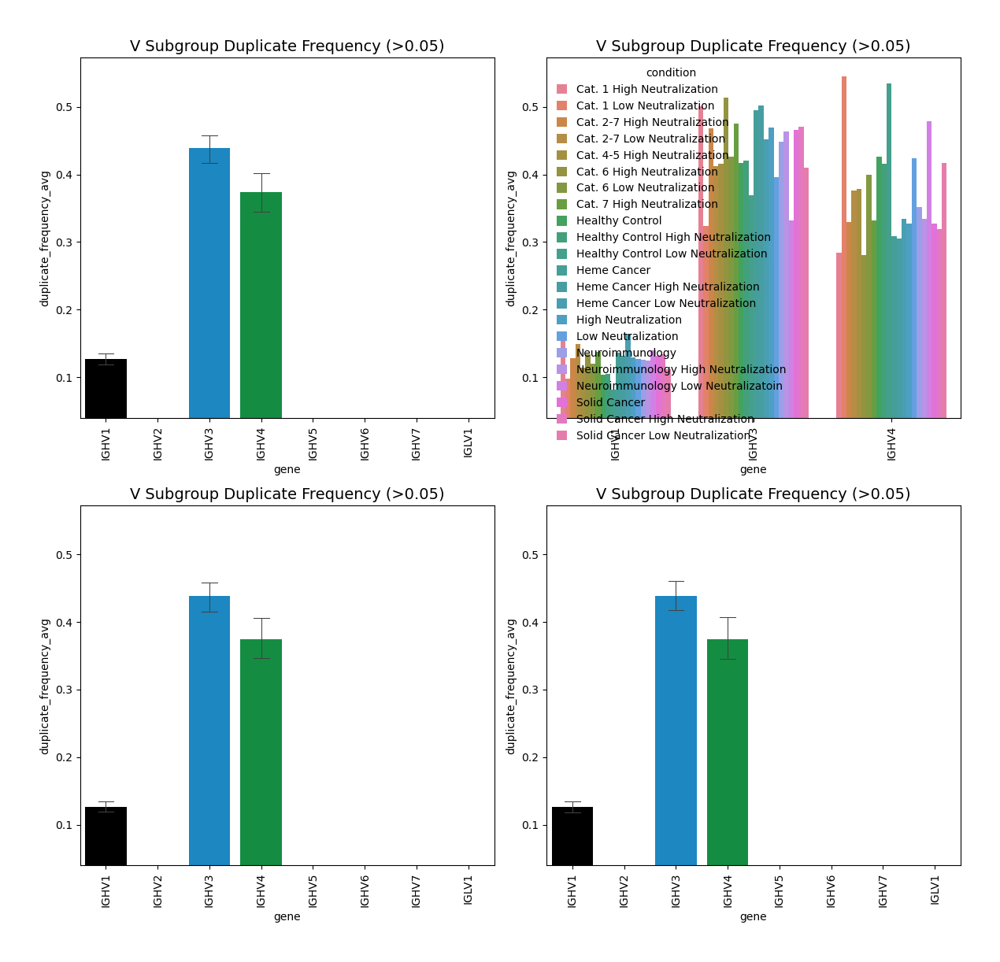

In [7]:
threshold = 0.05
ylim_mult = 0.8

df = br.load_gene_usage_group_data(
    repcalc_dir=repcalc_dir,
    groups=groups,
    processing_stage='igblast.makedb.gene.clone',
    call_type='v_call',
    level='subgroup'
)

# V Duplicate Frequency
def plot1(ax):
    gr.plot_duplicate_frequency(
        df=df,
        hue_order=None,
        palette=v_subgroup_cmap,
        threshold=threshold,
        title='V Subgroup Duplicate Frequency (>0.05)',
        ylim=(threshold*ylim_mult, None),
        ax=ax
    )

# split by Cat
def plot2(ax):
    gr.plot_duplicate_frequency(
        df=df,
        hue_order=None,
        palette=v_subgroup_cmap,
        threshold=threshold,
        title='V Subgroup Duplicate Frequency (>0.05)',
        ylim=(threshold*ylim_mult, None),
        split=True,
        ax=ax
    )

# std dev
def plot3(ax):
    gr.plot_duplicate_frequency(
        df=df,
        hue_order=None,
        palette=v_subgroup_cmap,
        threshold=threshold,
        title='V Subgroup Duplicate Frequency (>0.05)',
        ylim=(threshold*ylim_mult, None),
        errorbar=True,
        ax=ax
    )

# data points
def plot4(ax):
    gr.plot_duplicate_frequency(
        df=df,
        hue_order=None,
        palette=v_subgroup_cmap,
        threshold=threshold,
        title='V Subgroup Duplicate Frequency (>0.05)',
        ylim=(threshold*ylim_mult, None),
        datapoints=True,
        ax=ax
    )

# plot_two_side_by_side(plot1, plot2)
fig, axes = plot_two_by_two_layout(plot1, plot2, plot3, plot4, sharey=True)
fig.show()

### Subgroup, Duplicate Frequency

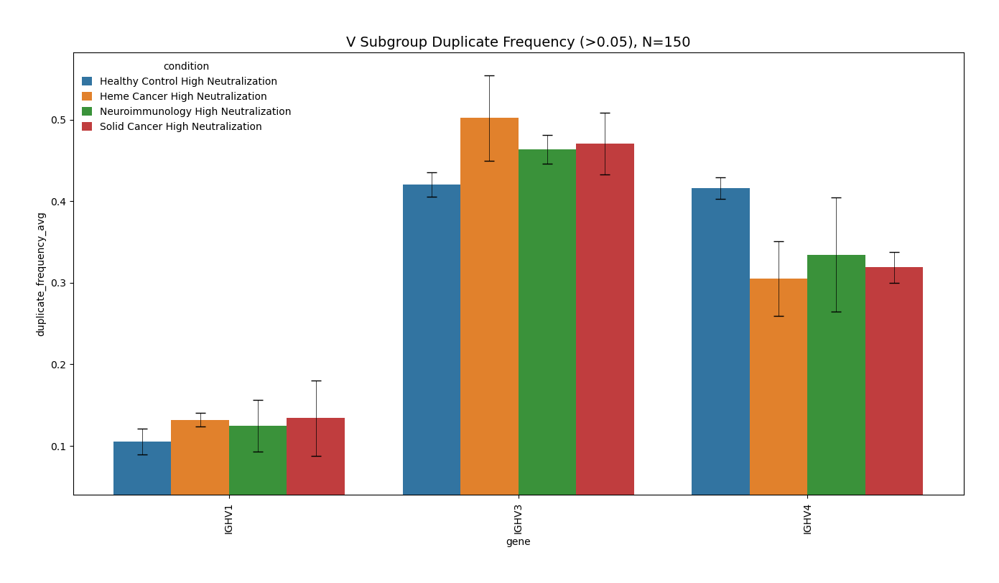

In [8]:
# add std.dev error bar 
# std.err of mean = std.dev/sqrt(N)

threshold = 0.05
ylim_mult = 0.8

df = br.load_gene_usage_group_data(
    repcalc_dir=repcalc_dir,
    groups=diag_hi_groups,
    processing_stage='igblast.makedb.gene.clone',
    call_type='v_call',
    level='subgroup'
)

# V Duplicate Frequency
fig, ax = gr.plot_duplicate_frequency(
    df=df,
    hue_order=None,
    palette=v_subgroup_cmap,
    threshold=threshold,
    title=f'V Subgroup Duplicate Frequency (>0.05), N={sum([e[2] for e in diag_hi_groups])}',
    ylim=(threshold*ylim_mult, None),
    split=True,
    errorbar='se'
)

fig.show()

### Gene, Duplicate Frequency

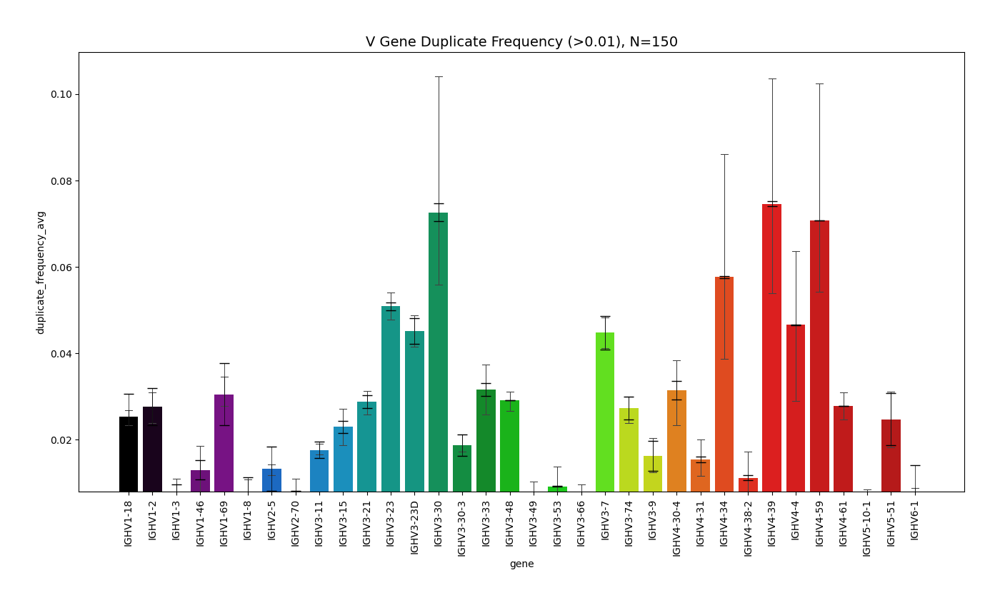

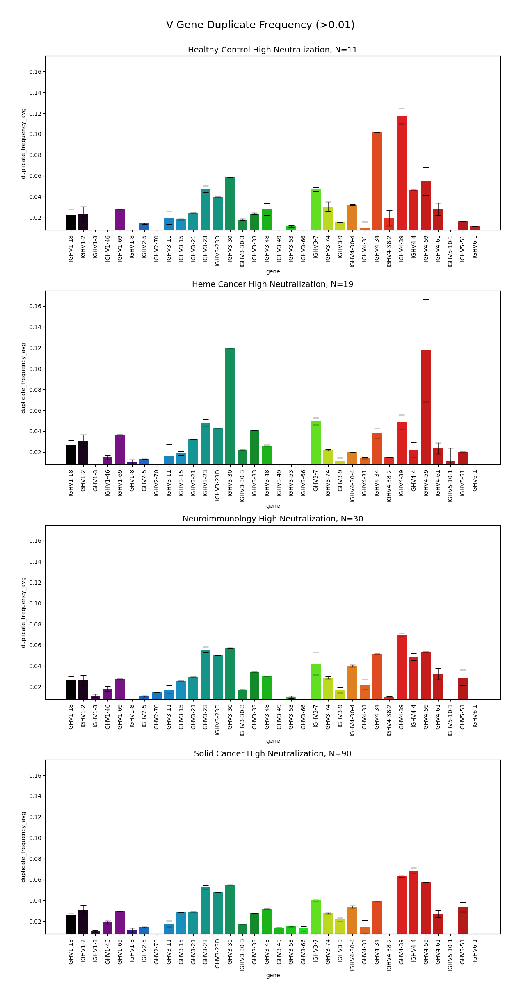

In [9]:
# add in number of samples on title
# add in number of unique to go next or on top
    # num_of_unique_seq/total_num_of_duplicate_seq

threshold = 0.01
ylim_mult = 0.8

df = br.load_gene_usage_group_data(
    repcalc_dir=repcalc_dir,
    groups=diag_hi_groups,
    processing_stage='igblast.makedb.gene.clone',
    call_type='v_call',
    level='gene'
)

genes = df[df['duplicate_frequency_avg']>=threshold]['gene'].unique()

fig, ax = gr.plot_duplicate_frequency(
    df=df,
    hue_order=None,
    palette=v_genes_cmap,
    threshold=threshold,
    title=f'V Gene Duplicate Frequency (>{threshold}), N={sum([e[2] for e in diag_hi_groups])}',
    ylim=(ylim_mult*threshold, None),
    categories=genes,
    split=False,
    errorbar='se'
)

fig.show()

def plot1(ax):
    group_name = diag_hi_groups[0][1]
    gr.plot_duplicate_frequency(
        df=df[df['condition']==group_name].copy(),
        hue_order=None,
        palette=v_genes_cmap,
        threshold=threshold,
        title=f'{group_name}, N={diag_hi_groups[0][2]}',
        ylim=(ylim_mult*threshold, None),
        ax=ax,
        categories=genes,
        split=False,
        errorbar='se'
    )

def plot2(ax):
    group_name = diag_hi_groups[1][1]
    gr.plot_duplicate_frequency(
        df=df[df['condition']==group_name].copy(),
        hue_order=None,
        palette=v_genes_cmap,
        threshold=threshold,
        title=f'{group_name}, N={diag_hi_groups[1][2]}',
        ylim=(ylim_mult*threshold, None),
        ax=ax,
        categories=genes,
        split=False,
        errorbar='se'
    )
def plot3(ax):
    group_name = diag_hi_groups[2][1]
    gr.plot_duplicate_frequency(
        df=df[df['condition']==group_name].copy(),
        hue_order=None,
        palette=v_genes_cmap,
        threshold=threshold,
        title=f'{group_name}, N={diag_hi_groups[2][2]}',
        ylim=(ylim_mult*threshold, None),
        ax=ax,
        categories=genes,
        split=False,
        errorbar='se'
    )
def plot4(ax):
    group_name = diag_hi_groups[3][1]
    ax = gr.plot_duplicate_frequency(
        df=df[df['condition']==group_name].copy(),
        hue_order=None,
        palette=v_genes_cmap,
        threshold=threshold,
        title=f'{group_name}, N={diag_hi_groups[3][2]}',
        ylim=(ylim_mult*threshold, None),
        ax=ax,
        categories=genes,
        split=False,
        errorbar='se'
    )

fig, axes = plot_four_vertical_layout(plot1, plot2, plot3, plot4, figsize=(12,24), sharey=True)
fig.suptitle(f'V Gene Duplicate Frequency (>{threshold})', fontsize=18)
fig.show()

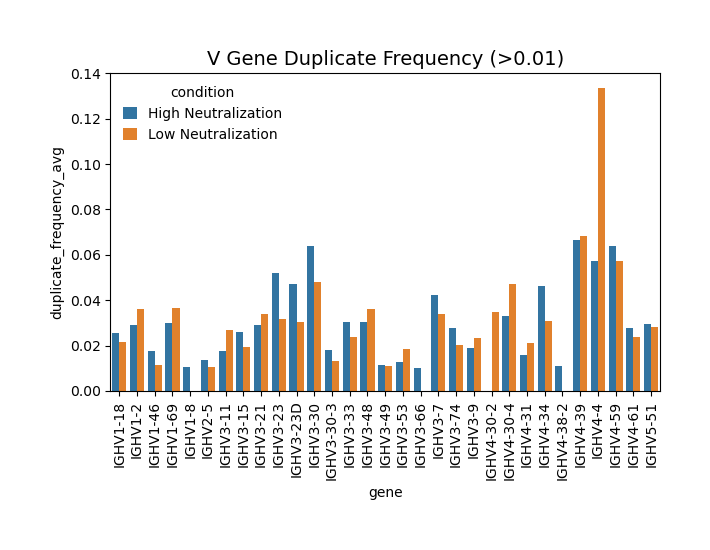

In [10]:
fig, ax = plt.subplots(1,1)

# V dup freq
threshold = 0.01
ylim_mult = 0

df = br.load_gene_usage_group_data(
    repcalc_dir=repcalc_dir,
    groups=groups[0:2],
    processing_stage='igblast.makedb.gene.clone',
    call_type='v_call',
    level='gene'
)

gr.plot_duplicate_frequency(
    df=df,
    palette=v_genes_cmap,
    threshold=threshold,
    title=f'V Gene Duplicate Frequency (>{threshold})',
    ylim=(ylim_mult*threshold, None),
    ax=ax,
    split=True
)

fig.show()


### subgroup/gene plot
new plot where each gene within a subgroup is shown

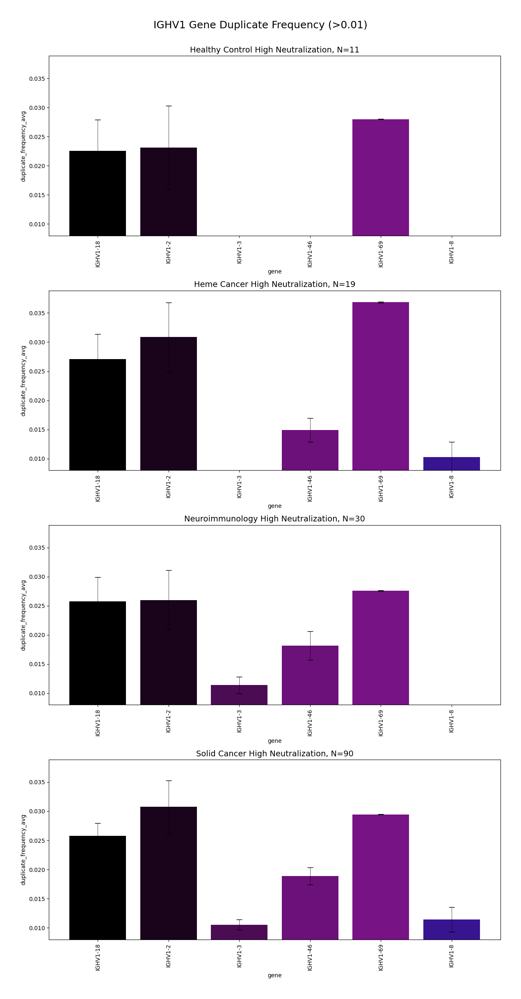

In [11]:
# add in number of unique to go next or on top
    # num_of_unique_seq/total_num_of_duplicate_seq

threshold = 0.01
ylim_mult = 0.8

for e in ['1', '3', '4']:
    df = br.load_gene_usage_group_data(
        repcalc_dir=repcalc_dir,
        groups=diag_hi_groups,
        processing_stage='igblast.makedb.gene.clone',
        call_type='v_call',
        level='gene'
    )

    df = df[df['gene'].str.split('').str[5]==e]
    genes = df[df['duplicate_frequency_avg']>=threshold]['gene'].unique()

    # add in number of samples on title
    # add in number of unique to go next or on top
        # num_of_unique_seq/total_num_of_duplicate_seq

    def plot1(ax):
        group_name = diag_hi_groups[0][1]
        gr.plot_duplicate_frequency(
            df=df[df['condition']==group_name].copy(),
            hue_order=None,
            palette=v_genes_cmap,
            threshold=threshold,
            title=f'{group_name}, N={diag_hi_groups[0][2]}',
            ylim=(ylim_mult*threshold, None),
            ax=ax,
            categories=genes,
            split=False,
            errorbar='se'
        )

    def plot2(ax):
        group_name = diag_hi_groups[1][1]
        gr.plot_duplicate_frequency(
            df=df[df['condition']==group_name].copy(),
            hue_order=None,
            palette=v_genes_cmap,
            threshold=threshold,
            title=f'{group_name}, N={diag_hi_groups[1][2]}',
            ylim=(ylim_mult*threshold, None),
            ax=ax,
            categories=genes,
            split=False,
            errorbar='se'
        )
    def plot3(ax):
        group_name = diag_hi_groups[2][1]
        gr.plot_duplicate_frequency(
            df=df[df['condition']==group_name].copy(),
            hue_order=None,
            palette=v_genes_cmap,
            threshold=threshold,
            title=f'{group_name}, N={diag_hi_groups[2][2]}',
            ylim=(ylim_mult*threshold, None),
            ax=ax,
            categories=genes,
            split=False,
            errorbar='se'
        )
    def plot4(ax):
        group_name = diag_hi_groups[3][1]
        ax = gr.plot_duplicate_frequency(
            df=df[df['condition']==group_name].copy(),
            hue_order=None,
            palette=v_genes_cmap,
            threshold=threshold,
            title=f'{group_name}, N={diag_hi_groups[3][2]}',
            ylim=(ylim_mult*threshold, None),
            ax=ax,
            categories=genes,
            split=False,
            errorbar='se'
        )

    fig, axes = plot_four_vertical_layout(plot1, plot2, plot3, plot4, figsize=(12,24), sharey=True)
    fig.suptitle(f'IGHV{e} Gene Duplicate Frequency (>{threshold})', fontsize=18)
    fig.show()
    break

## J

### Subgroup, Duplicate Frequency

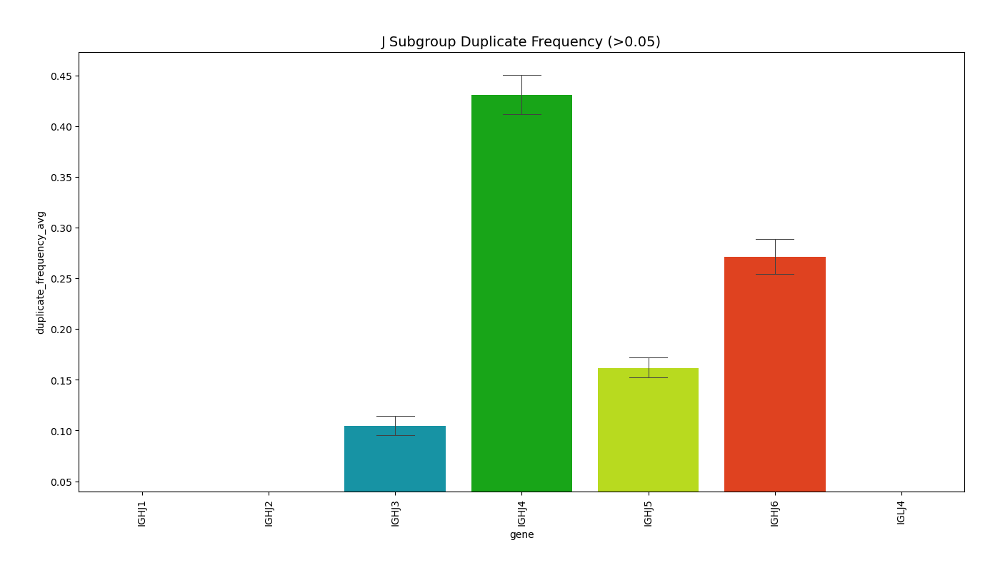

In [12]:
threshold = 0.05
ylim_mult = 0.8

df = br.load_gene_usage_group_data(
    repcalc_dir=repcalc_dir,
    groups=groups,
    processing_stage='igblast.makedb.gene.clone',
    call_type='j_call',
    level='subgroup'
)

fig, ax = gr.plot_duplicate_frequency(
    df=df,
    hue_order=None,
    palette=j_subgroup_cmap,
    threshold=threshold,
    title=f'J Subgroup Duplicate Frequency (>{threshold})',
    ylim=(threshold*ylim_mult, None)
)

fig.show()

### Gene, Duplicate Frequency

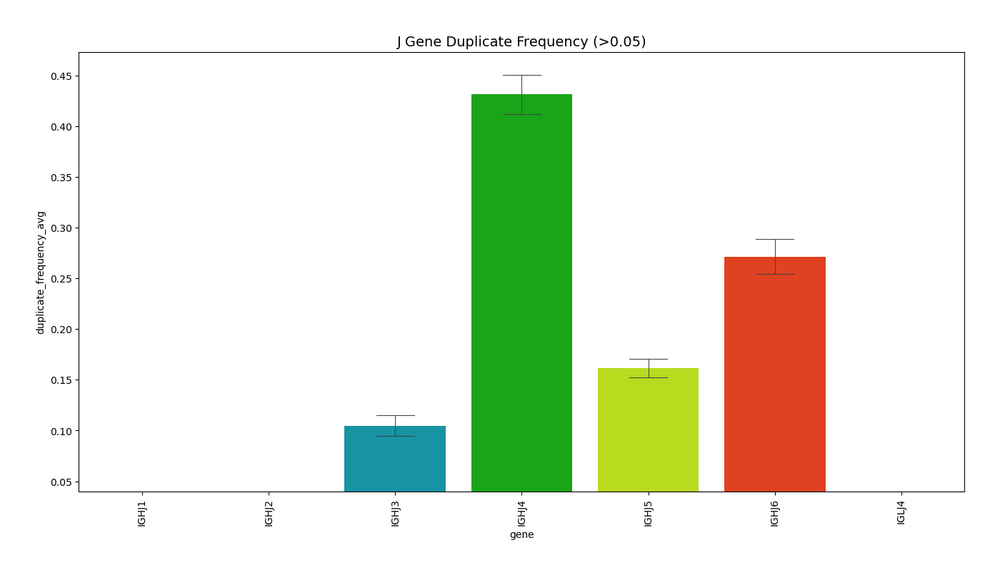

In [13]:
threshold = 0.05
ylim_mult = 0.8

df = br.load_gene_usage_group_data(
    repcalc_dir=repcalc_dir,
    groups=groups,
    processing_stage='igblast.makedb.gene.clone',
    call_type='j_call',
    level='gene'
)

fig, ax = gr.plot_duplicate_frequency(
    df=df,
    hue_order=None,
    palette=j_genes_cmap,
    threshold=0.05,
    title=f'J Gene Duplicate Frequency (>{threshold})',
    ylim=(threshold*ylim_mult, None)
)

fig.show()

## Chord Diagram

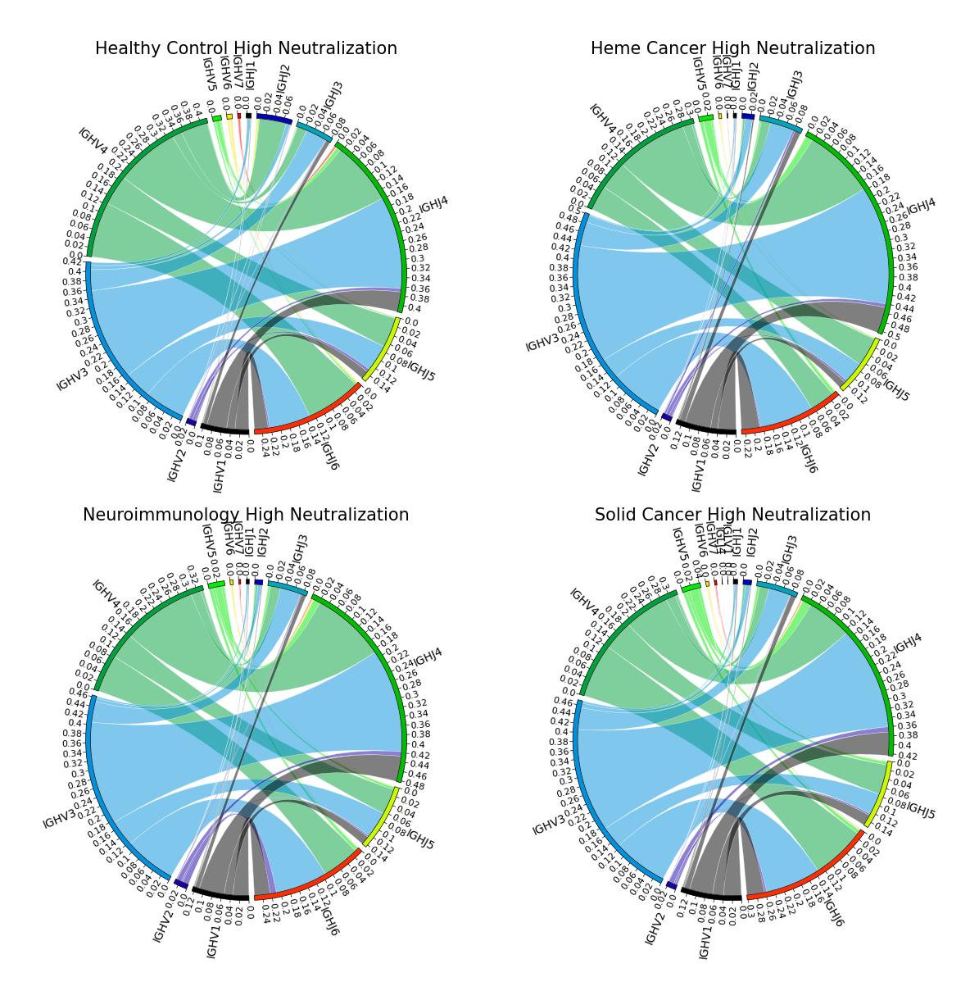

In [14]:
def plot_top_left(ax):
    df = br.load_and_prepare_data_vj_combo(
        repcalc_dir=repcalc_dir,
        group_id=diag_hi_groups[0][0],
        combo_type='vj_combo',
        processing_stage='.igblast.makedb.gene.clone.group.'
    )

    gr.plot_vj_chord_diagram(
        df=df,
        freq_col='duplicate_frequency_avg',
        ticks_interval=0.02,
        max_links=None,
        cmap=v_subgroup_cmap | j_subgroup_cmap,
        title=diag_hi_groups[0][1],
        ax=ax
    )
def plot_top_right(ax):
    df = br.load_and_prepare_data_vj_combo(
        repcalc_dir=repcalc_dir,
        group_id=diag_hi_groups[1][0],
        combo_type='vj_combo',
        processing_stage='.igblast.makedb.gene.clone.group.'
    )

    gr.plot_vj_chord_diagram(
        df=df,
        freq_col='duplicate_frequency_avg',
        ticks_interval=0.02,
        max_links=None,
        cmap=v_subgroup_cmap | j_subgroup_cmap,
        title=diag_hi_groups[1][1],
        ax=ax
    )
def plot_bottom_left(ax):
    df = br.load_and_prepare_data_vj_combo(
        repcalc_dir=repcalc_dir,
        group_id=diag_hi_groups[2][0],
        combo_type='vj_combo',
        processing_stage='.igblast.makedb.gene.clone.group.'
    )

    gr.plot_vj_chord_diagram(
        df=df,
        freq_col='duplicate_frequency_avg',
        ticks_interval=0.02,
        max_links=None,
        cmap=v_subgroup_cmap | j_subgroup_cmap,
        title=diag_hi_groups[2][1],
        ax=ax
    )
def plot_bottom_right(ax):
    df = br.load_and_prepare_data_vj_combo(
        repcalc_dir=repcalc_dir,
        group_id=diag_hi_groups[3][0],
        combo_type='vj_combo',
        processing_stage='.igblast.makedb.gene.clone.group.'
    )

    gr.plot_vj_chord_diagram(
        df=df,
        freq_col='duplicate_frequency_avg',
        ticks_interval=0.02,
        max_links=None,
        cmap=v_subgroup_cmap | j_subgroup_cmap,
        title=diag_hi_groups[3][1],
        ax=ax
    )

fig, (ax1, ax2, ax3, ax4) = plot_two_by_two_layout(
    plot_top_left, 
    plot_top_right, 
    plot_bottom_left, 
    plot_bottom_right, 
    figsize=(12, 12), 
    sharey=False, 
    suptitle=None, 
    projection_top_left='polar',
    projection_top_right='polar',
    projection_bottom_left='polar',
    projection_bottom_right='polar'
)

fig.show()

In [15]:
# df = br.load_and_prepare_data_vj_combo(
#     repcalc_dir=repcalc_dir,
#     group_id=diag_hi_groups[0][0],
#     combo_type='vj_combo',
#     processing_stage='.igblast.makedb.gene.clone.group.'
# )

# gr.plot_vj_chord_diagram(
#     df=df,
#     freq_col='duplicate_frequency_avg',
#     ticks_interval=0.02,
#     max_links=None,
#     cmap=v_subgroup_cmap | j_subgroup_cmap,
#     title=diag_hi_groups[0][1]+' VJ Chord Diagram',
#     ax=ax
# )

In [16]:
# for group_id, group_name, *_ in groups:
#     df = br.load_and_prepare_data_vj_combo(
#         repcalc_dir=repcalc_dir,
#         group_id=group_id,
#         combo_type='vj_combo',
#         processing_stage='.igblast.makedb.group.'
#     )

#     fig, ax = gr.plot_vj_chord_diagram(
#         df=df,
#         freq_col='duplicate_frequency_avg',
#         ticks_interval=0.02,
#         max_links=None,
#         cmap=v_subgroup_cmap | j_subgroup_cmap,
#         title=group_name+' VJ Chord Diagram'
#     )
    
#     fig.show()

#     break


### Multiplots

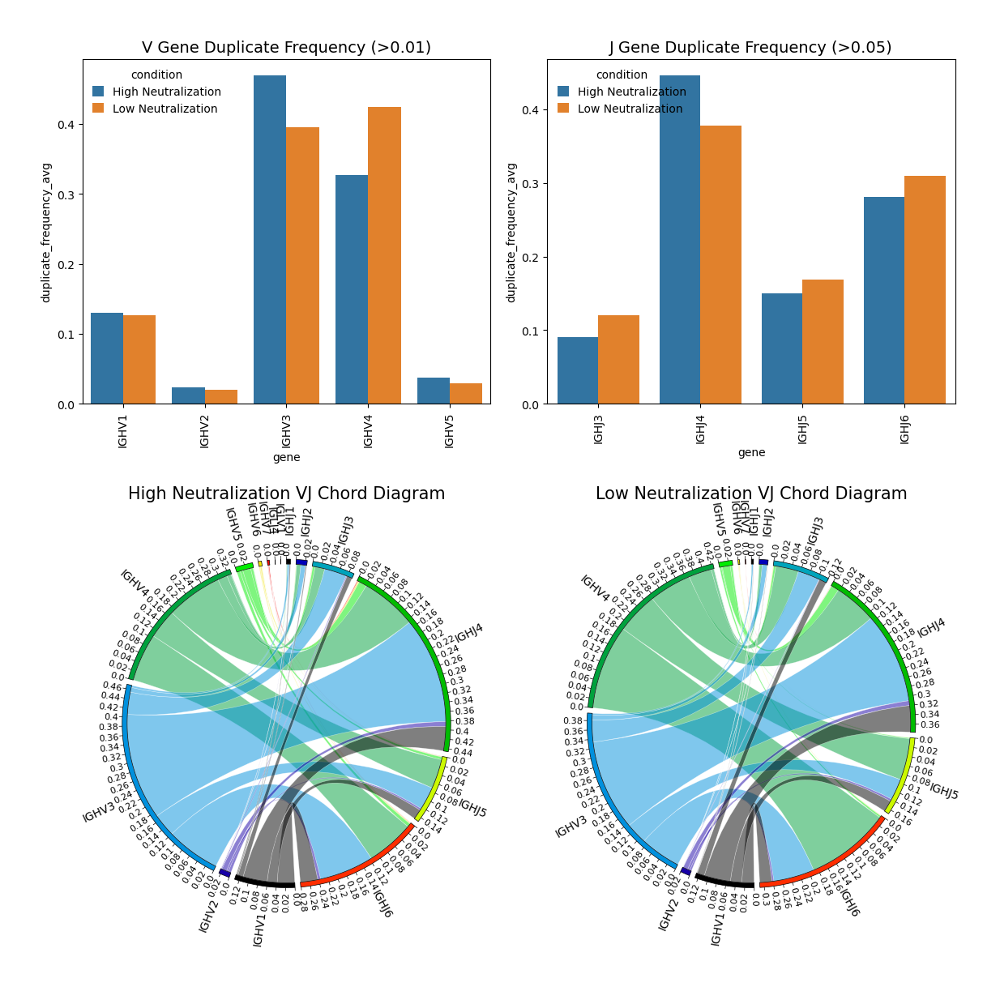

In [17]:
for i, (group_id, group_name, *_) in enumerate(groups):

    if i!=0:
        small_group = [
            (prev_group_id, prev_group_name),
            (group_id, group_name)
        ]

        def plot_top_left(ax):
            # V dup freq
            threshold = 0.01
            ylim_mult = 0

            df = br.load_gene_usage_group_data(
                repcalc_dir=repcalc_dir,
                groups=small_group,
                processing_stage='igblast.makedb.gene.clone',
                call_type='v_call',
                level='subgroup'
            )

            gr.plot_duplicate_frequency(
                df=df,
                threshold=threshold,
                title=f'V Gene Duplicate Frequency (>{threshold})',
                ylim=(ylim_mult*threshold, None),
                ax=ax,
                split=True
            )

        def plot_top_right(ax):
            threshold = 0.05
            ylim_mult = 0

            df = br.load_gene_usage_group_data(
                repcalc_dir=repcalc_dir,
                groups=small_group,
                processing_stage='igblast.makedb.gene.clone',
                call_type='j_call',
                level='subgroup'
            )

            gr.plot_duplicate_frequency(
                df=df,
                threshold=0.05,
                title=f'J Gene Duplicate Frequency (>{threshold})',
                ylim=(threshold*ylim_mult, None),
                ax=ax,
                split=True
            )

        def plot_bottom_left(ax):
            df = br.load_and_prepare_data_vj_combo(
                repcalc_dir=repcalc_dir,
                group_id=small_group[0][0],
                combo_type='vj_combo',
                processing_stage='.igblast.makedb.group.'
            )

            gr.plot_vj_chord_diagram(
                df=df,
                freq_col='duplicate_frequency_avg',
                ticks_interval=0.02,
                max_links=None,
                cmap=v_subgroup_cmap | j_subgroup_cmap,
                title=small_group[0][1]+' VJ Chord Diagram',
                ax=ax
            )

        def plot_bottom_right(ax):
            df = br.load_and_prepare_data_vj_combo(
                repcalc_dir=repcalc_dir,
                group_id=small_group[1][0],
                combo_type='vj_combo',
                processing_stage='.igblast.makedb.group.'
            )

            gr.plot_vj_chord_diagram(
                df=df,
                freq_col='duplicate_frequency_avg',
                ticks_interval=0.02,
                max_links=None,
                cmap=v_subgroup_cmap | j_subgroup_cmap,
                title=small_group[1][1]+' VJ Chord Diagram',
                ax=ax
            )

        plot_two_by_two_layout(
            plot_top_left,
            plot_top_right,
            plot_bottom_left,
            plot_bottom_right,
            projection_bottom_left='polar',
            projection_bottom_right='polar'
        )

        break

    prev_group_id = group_id
    prev_group_name = group_name

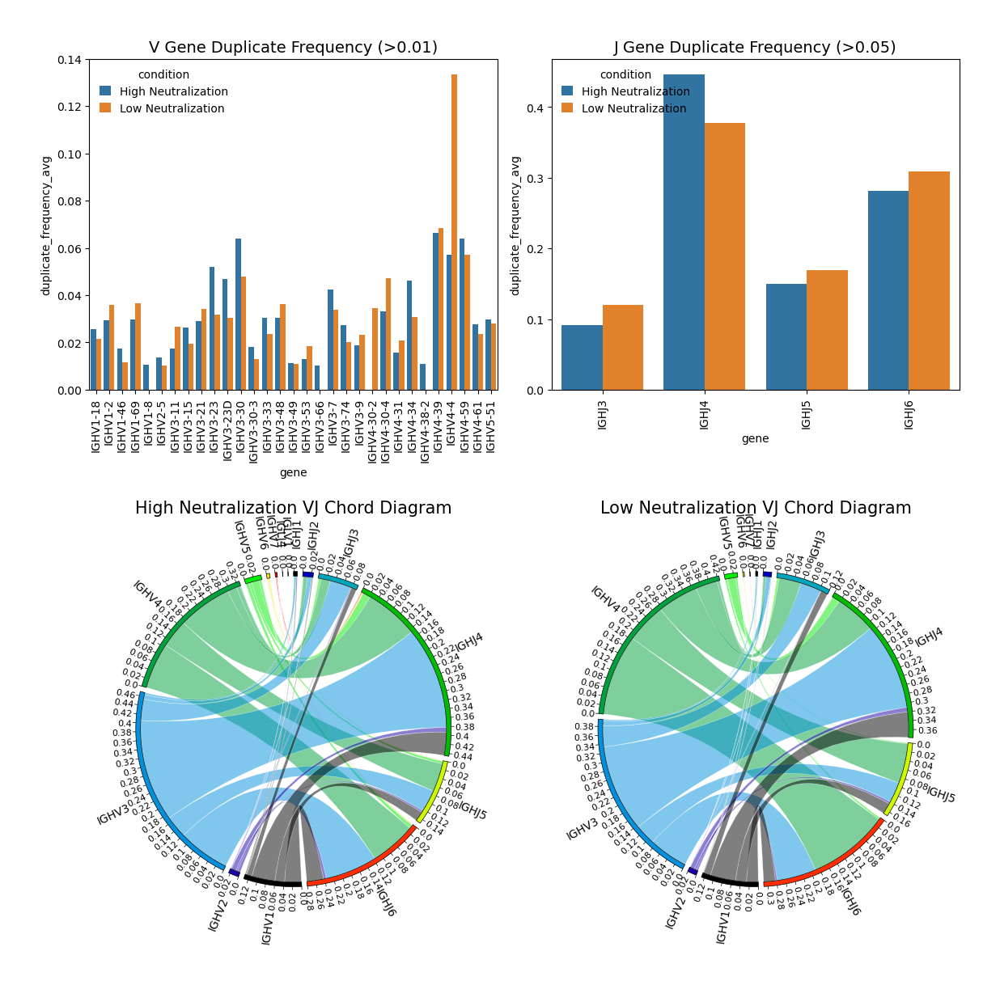

In [18]:
for i, (group_id, group_name, *_) in enumerate(groups):

    if i!=0:
        small_group = [
            (prev_group_id, prev_group_name),
            (group_id, group_name)
        ]

        def plot_top_left(ax):
            # V dup freq
            threshold = 0.01
            ylim_mult = 0

            df = br.load_gene_usage_group_data(
                repcalc_dir=repcalc_dir,
                groups=small_group,
                processing_stage='igblast.makedb.gene.clone',
                call_type='v_call',
                level='gene'
            )

            gr.plot_duplicate_frequency(
                df=df,
                threshold=threshold,
                title=f'V Gene Duplicate Frequency (>{threshold})',
                ylim=(ylim_mult*threshold, None),
                ax=ax,
                split=True
            )

        def plot_top_right(ax):
            threshold = 0.05
            ylim_mult = 0

            df = br.load_gene_usage_group_data(
                repcalc_dir=repcalc_dir,
                groups=small_group,
                processing_stage='igblast.makedb.gene.clone',
                call_type='j_call',
                level='gene'
            )

            gr.plot_duplicate_frequency(
                df=df,
                threshold=0.05,
                title=f'J Gene Duplicate Frequency (>{threshold})',
                ylim=(threshold*ylim_mult, None),
                ax=ax,
                split=True
            )

        def plot_bottom_left(ax):
            df = br.load_and_prepare_data_vj_combo(
                repcalc_dir=repcalc_dir,
                group_id=small_group[0][0],
                combo_type='vj_combo',
                processing_stage='.igblast.makedb.group.'
            )

            gr.plot_vj_chord_diagram(
                df=df,
                freq_col='duplicate_frequency_avg',
                ticks_interval=0.02,
                max_links=None,
                cmap=v_subgroup_cmap | j_subgroup_cmap,
                title=small_group[0][1]+' VJ Chord Diagram',
                ax=ax
            )

        def plot_bottom_right(ax):
            df = br.load_and_prepare_data_vj_combo(
                repcalc_dir=repcalc_dir,
                group_id=small_group[1][0],
                combo_type='vj_combo',
                processing_stage='.igblast.makedb.group.'
            )

            gr.plot_vj_chord_diagram(
                df=df,
                freq_col='duplicate_frequency_avg',
                ticks_interval=0.02,
                max_links=None,
                cmap=v_subgroup_cmap | j_subgroup_cmap,
                title=small_group[1][1]+' VJ Chord Diagram',
                ax=ax
            )

        plot_two_by_two_layout(
            plot_top_left,
            plot_top_right,
            plot_bottom_left,
            plot_bottom_right,
            projection_bottom_left='polar',
            projection_bottom_right='polar'
        )

        break

    prev_group_id = group_id
    prev_group_name = group_name

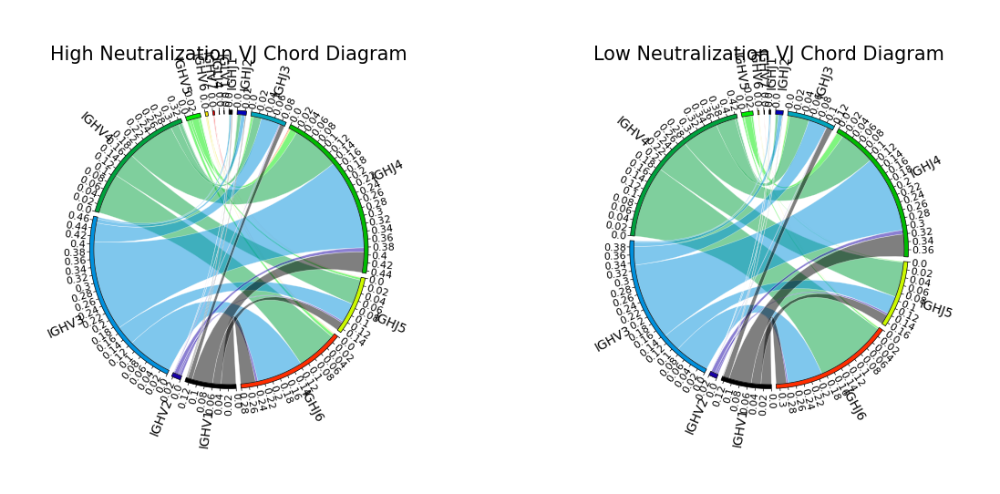

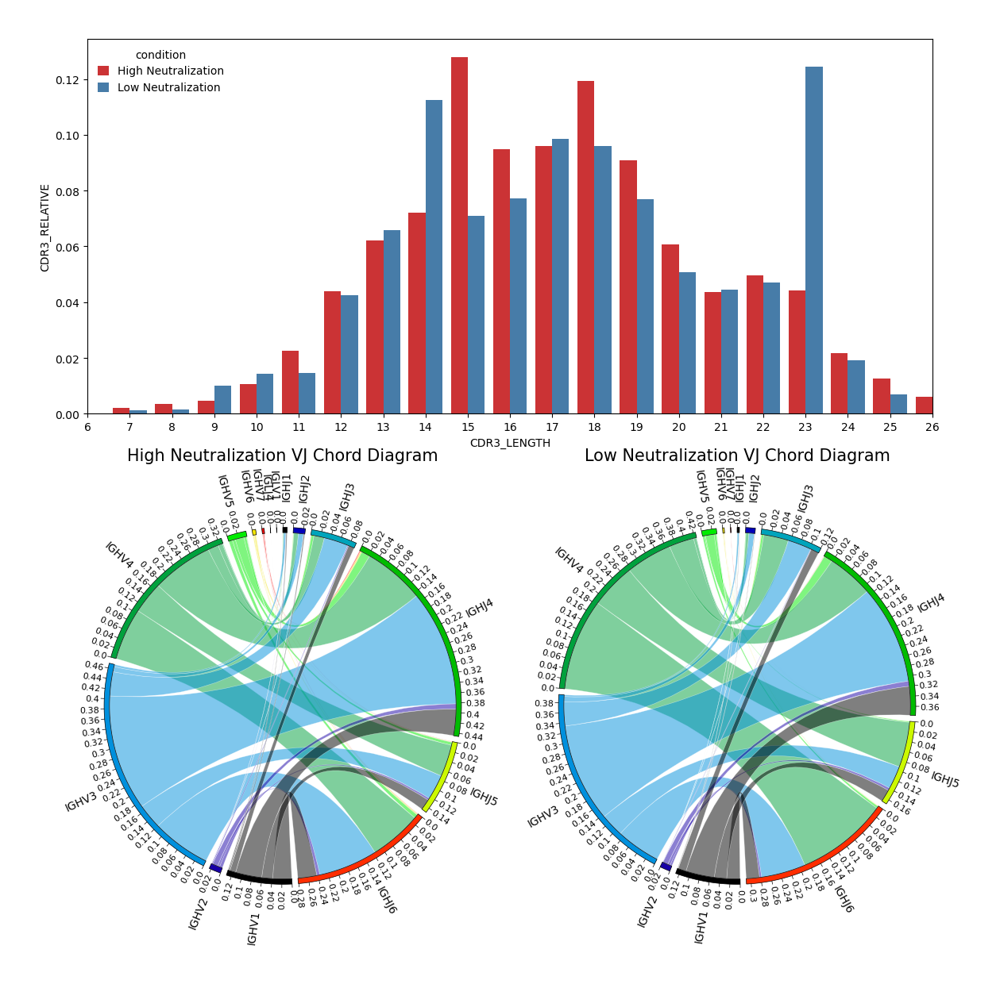

In [19]:
for i, (group_id, group_name, *_) in enumerate(groups):

    if i!=0:
        small_group = [
            (prev_group_id, prev_group_name),
            (group_id, group_name)
        ]
        
        def plot1(ax):    
            df = br.load_and_prepare_data_junction_aa(
                repcalc_dir=repcalc_dir,
                groups=small_group,
                processing_stage='.igblast.makedb.allele.clone.group.',
                call_type='junction_aa_length'
            )

            gr.plot_junction_aa_length(
                df=df,
                x_col='CDR3_LENGTH',
                y_col='CDR3_RELATIVE',
                hue_col='condition',
                ax=ax,
                aa_range=(6,26)
            )

        def plot2(ax):
            df = br.load_and_prepare_data_vj_combo(
                repcalc_dir=repcalc_dir,
                group_id=prev_group_id,
                combo_type='vj_combo',
                processing_stage='.igblast.makedb.group.'
            )

            gr.plot_vj_chord_diagram(
                df=df,
                freq_col='duplicate_frequency_avg',
                ticks_interval=0.02,
                max_links=None,
                cmap=v_subgroup_cmap | j_subgroup_cmap,
                title=prev_group_name+' VJ Chord Diagram',
                ax=ax
            )
        
        def plot3(ax):
            df = br.load_and_prepare_data_vj_combo(
                repcalc_dir=repcalc_dir,
                group_id=group_id,
                combo_type='vj_combo',
                processing_stage='.igblast.makedb.group.'
            )

            gr.plot_vj_chord_diagram(
                df=df,
                freq_col='duplicate_frequency_avg',
                ticks_interval=0.02,
                max_links=None,
                cmap=v_subgroup_cmap | j_subgroup_cmap,
                title=group_name+' VJ Chord Diagram',
                ax=ax
            )
    
    if i!=0:
        if i==1:
            fig, axes = plot_two_side_by_side(plot2, plot3, figsize=(12, 8), sharey=True, suptitle=None, projection1='polar', projection2='polar')
            fig.show()
        fig, axes = plot_three_split_layout(plot1, plot2, plot3, figsize=(12, 12), suptitle=None, projection_bottom_left='polar', projection_bottom_right='polar')
        fig.show()
        break

    prev_group_id = group_id
    prev_group_name = group_name

## CDR3

### Junction AA Length

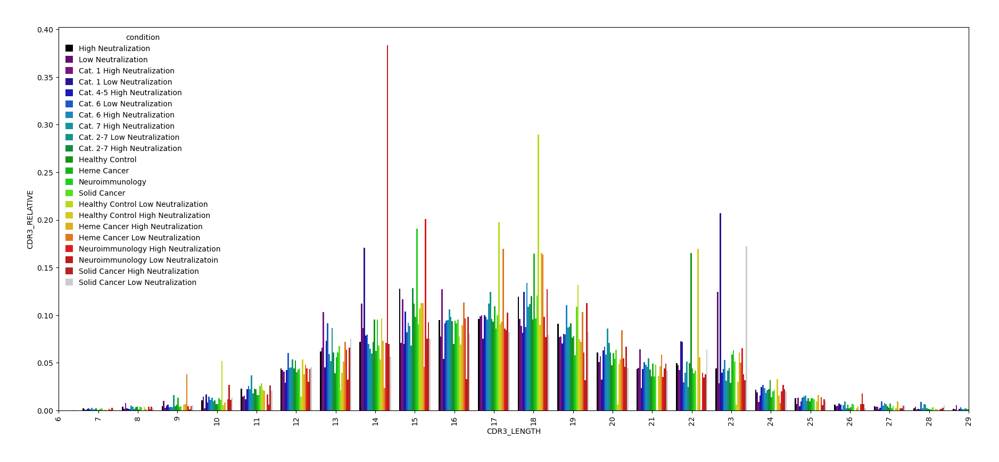

In [20]:
df = br.load_and_prepare_data_junction_aa(
    repcalc_dir=repcalc_dir,
    groups=groups,
    processing_stage='.igblast.makedb.allele.clone.group.',
    call_type='junction_aa_length'
)

fig, ax = gr.plot_junction_aa_length(
    df=df,
    x_col='CDR3_LENGTH',
    y_col='CDR3_RELATIVE',
    hue_col='condition',
    palette=cond_cmap
)

fig.show()

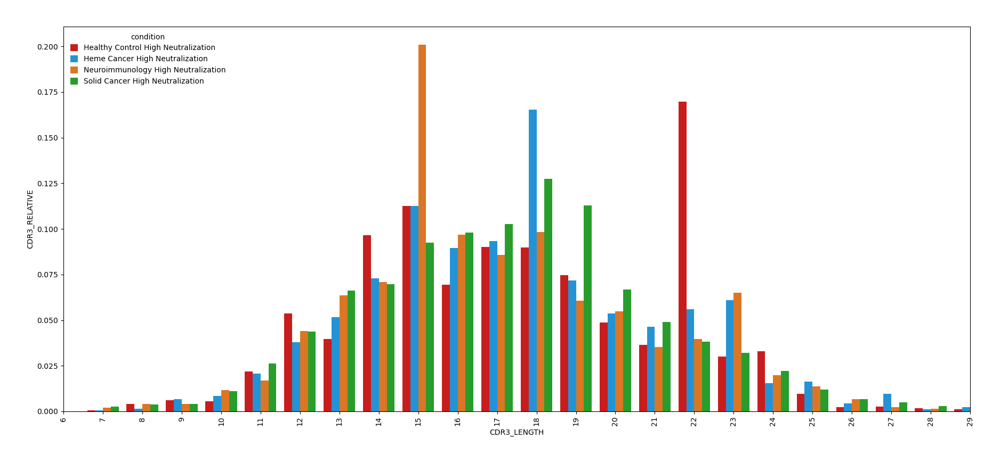

In [21]:
df = br.load_and_prepare_data_junction_aa(
    repcalc_dir=repcalc_dir,
    groups=diag_hi_groups,
    processing_stage='.igblast.makedb.allele.clone.group.',
    call_type='junction_aa_length'
)

fig, ax = gr.plot_junction_aa_length(
    df=df,
    x_col='CDR3_LENGTH',
    y_col='CDR3_RELATIVE',
    hue_col='condition',
    palette=['xkcd:red', 'xkcd:azure', 'xkcd:orange', 'xkcd:green']
)

fig.show()

### Heatmap

Can be used to compare between or within groups

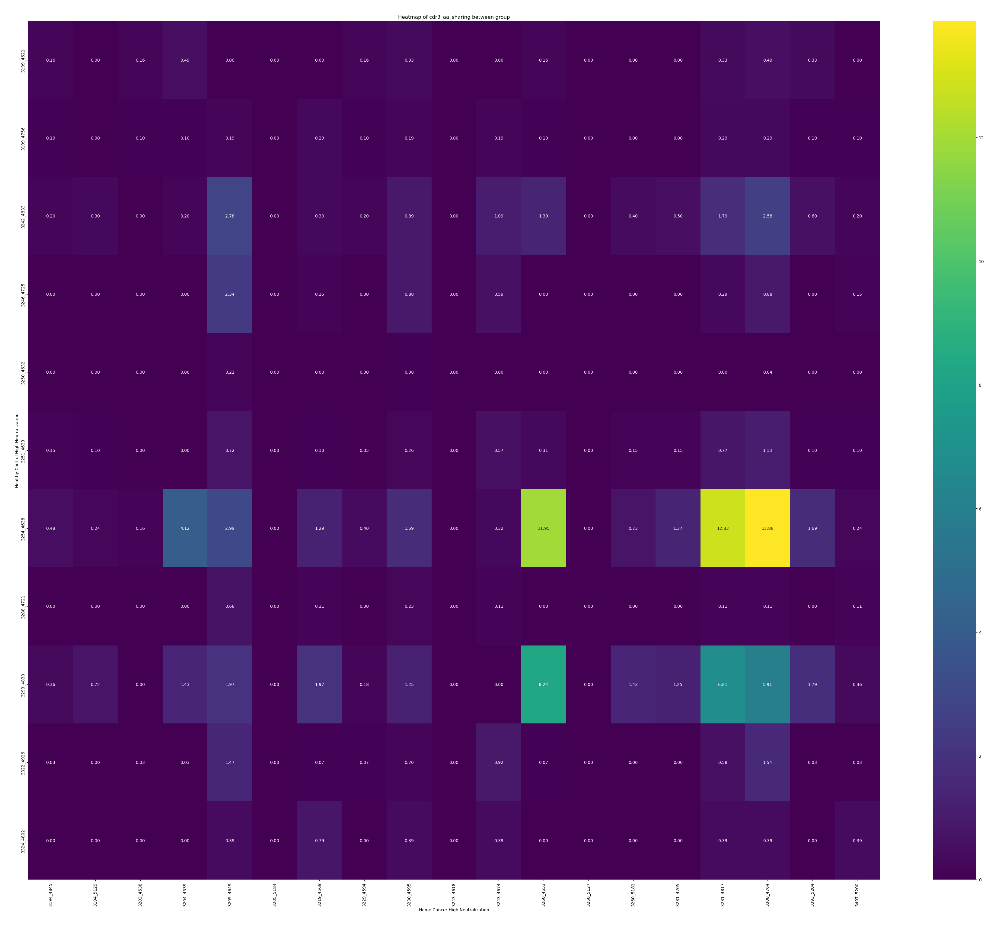

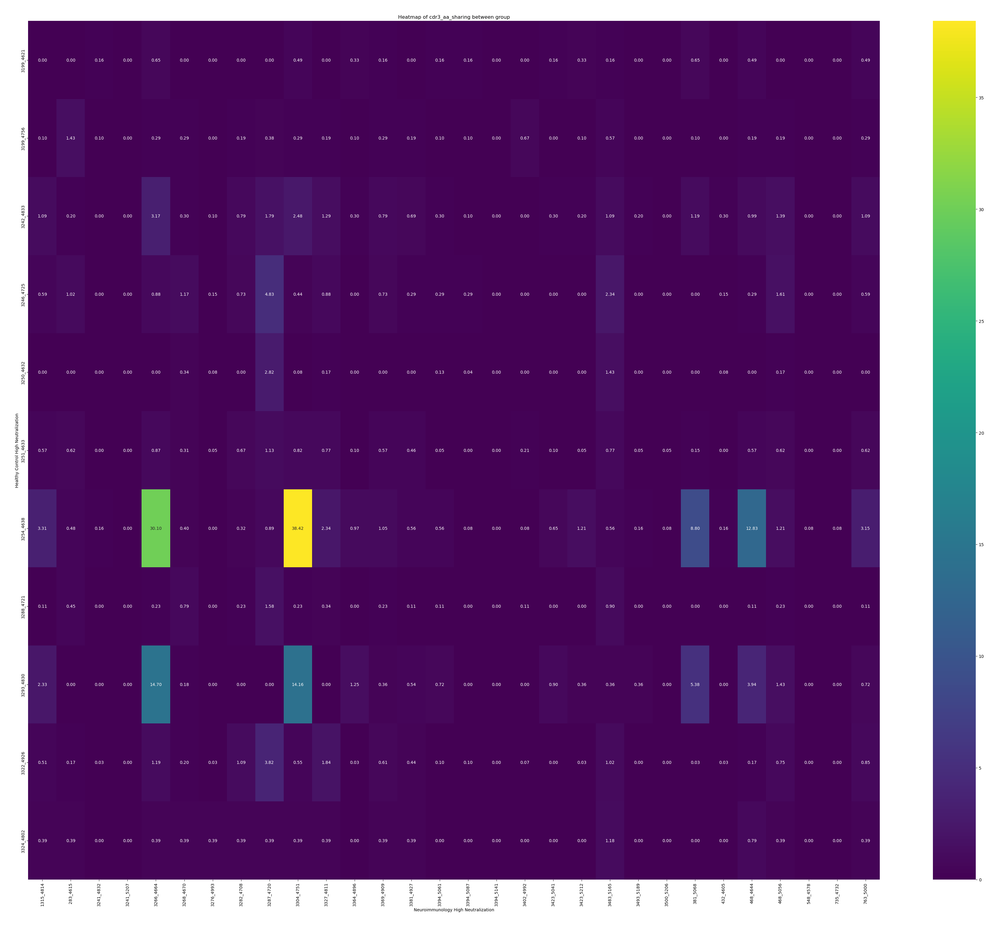

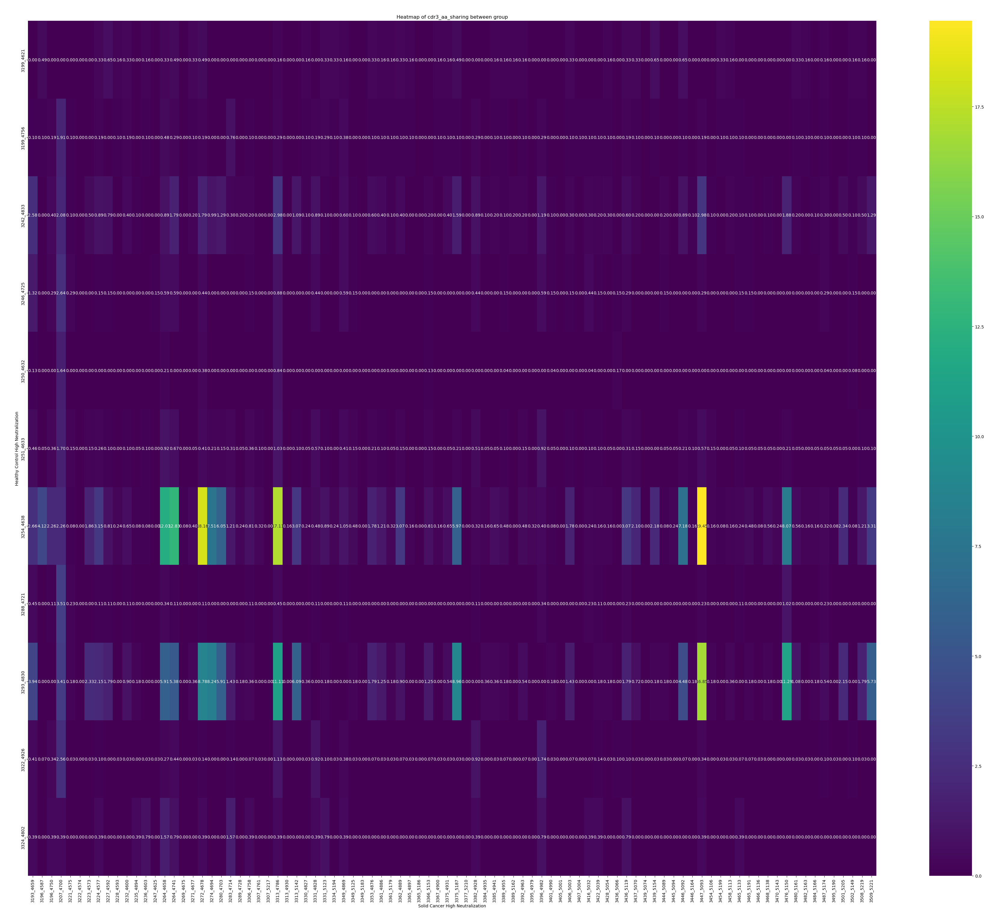

In [22]:
# plot_type = 'between' if len(groups) == 2 else 'within'
plot_type = 'between'

sharing = 'cdr3_aa_sharing'
processing_stage = 'repertoire.shared.matrix'
# processing_stage = 'group.summary_comparison'

similarity_metric = 'a_in_b' #jaccard, simpson_coefficient, a_in_b, b_in_a
# similarity_metric = 'b_in_a' #jaccard, simpson_coefficient, a_in_b, b_in_a
percentage = True

# setup to compare against healthy control (diag_hi_groups[0])
for i, group in enumerate(diag_hi_groups): # group = group_id, group_name/cond
    if i!=0:
        matrix = br.load_shared_cdr3_aa_data(
            repcalc_dir,
            repertoire_groups, 
            sample_info_df, 
            groups=[control, group], 
            percentage=percentage,
            similarity_metric=similarity_metric,
            sharing=sharing,
            processing_stage=processing_stage,
            plot_type=plot_type
        )
        matrix = matrix.sort_index().sort_index(axis=1)
        fig, ax = gr.plot_cdr3_aa_sharing_heatmap(matrix, cmap = 'viridis', figsize = (36, 30))
        plt.title(f"Heatmap of {sharing} {plot_type} group")
        plt.tight_layout()
    else:
        control = group
    # if i==1:
    #     break

### Sequence Count

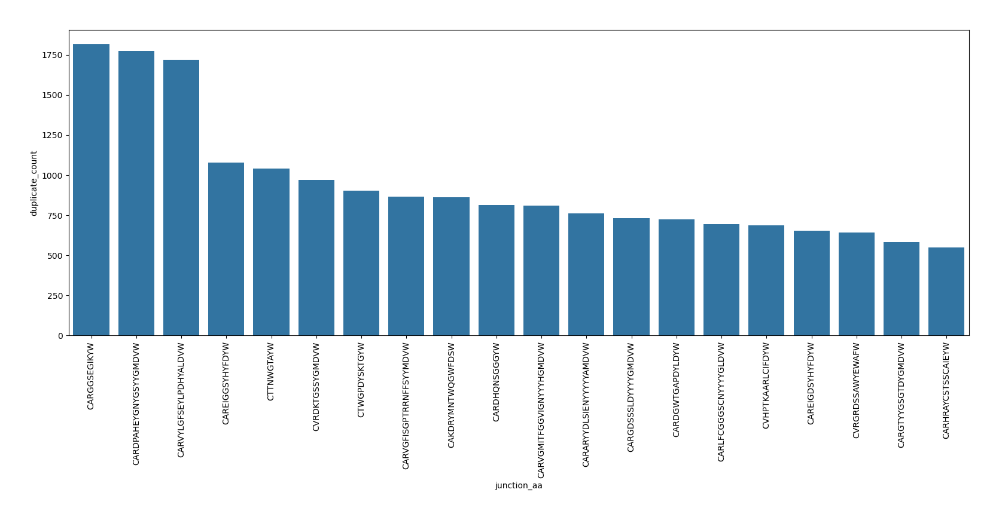

In [23]:
df = br.load_cdr3_sequences_each_repertoire(
    repcalc_dir=repcalc_dir,
    repertoire_id=data['Repertoire'][0]['repertoire_id'],
    sharing='cdr3_aa_sharing',
    processing_stage='repertoire'
)

fig, ax = gr.plot_cdr3_sequence_count(
    df=df,
    abundance=True,
    top_n=20,
    figsize=(16,8)
)

fig.show()

### Uniques

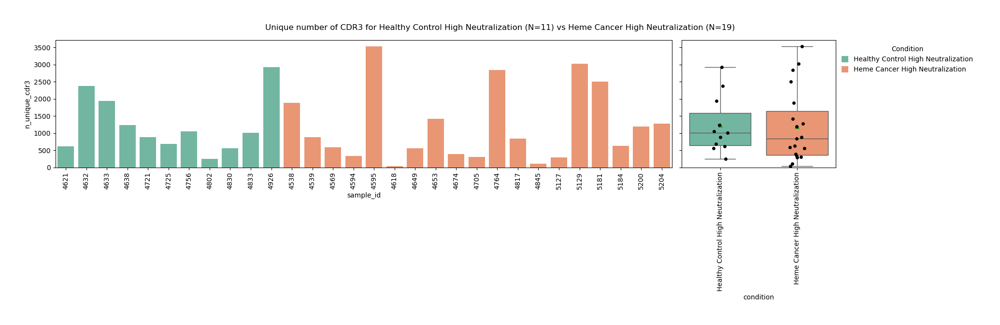

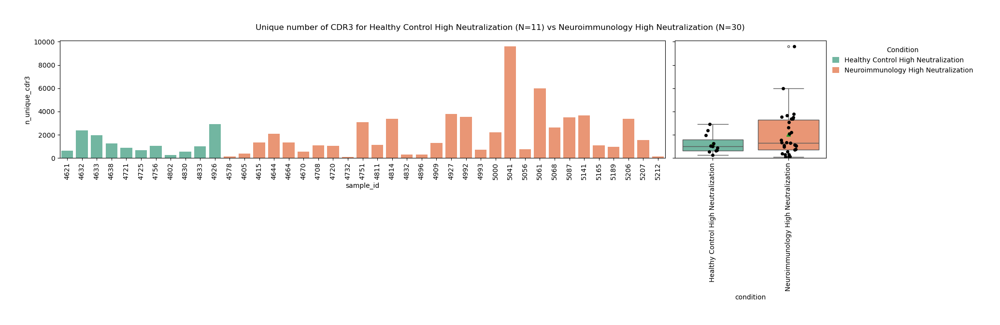

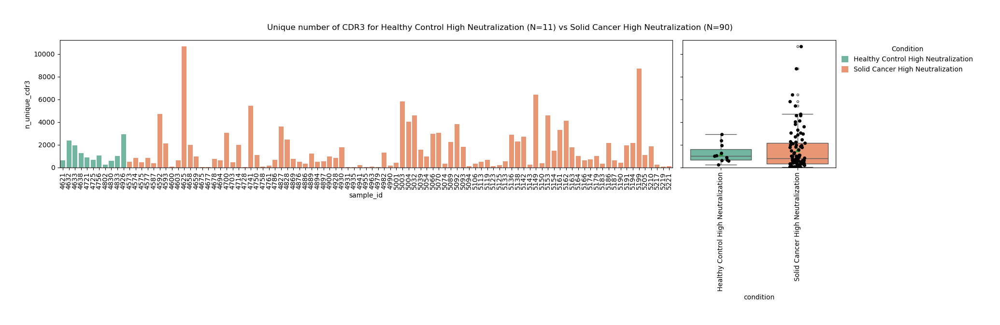

In [24]:
sharing='cdr3_aa_sharing'
processing_stage='repertoire'

for i, group in enumerate(diag_hi_groups): # group = group_id, group_name/cond, group_n
    if i!=0:
        df = br.load_unique_cdr3_sequence_numbers(
            repcalc_dir,
            repertoire_groups,
            groups=[prev_group, group],
            sample_info_df=sample_info_df,
            sharing=sharing,
            processing_stage=processing_stage
        )
        fig, ax = gr.plot_unique_number_of_cdr3(
            df,
            palette='Set2',
            figsize=(20, 6)
        )
        plt.suptitle(f"Unique number of CDR3 for {' vs '.join([prev_group[1]+f' (N={prev_group[2]})', group[1]+f' (N={group[2]})'])}")
        plt.tight_layout()
        # figname = f'Figures/unique_number_of_cdr3_{'_'.join(group_names)}.png'
        # plt.savefig(figname, bbox_inches = 'tight', dpi = 300)
        plt.show()
    else:
        prev_group = group

## Clonal Abundance

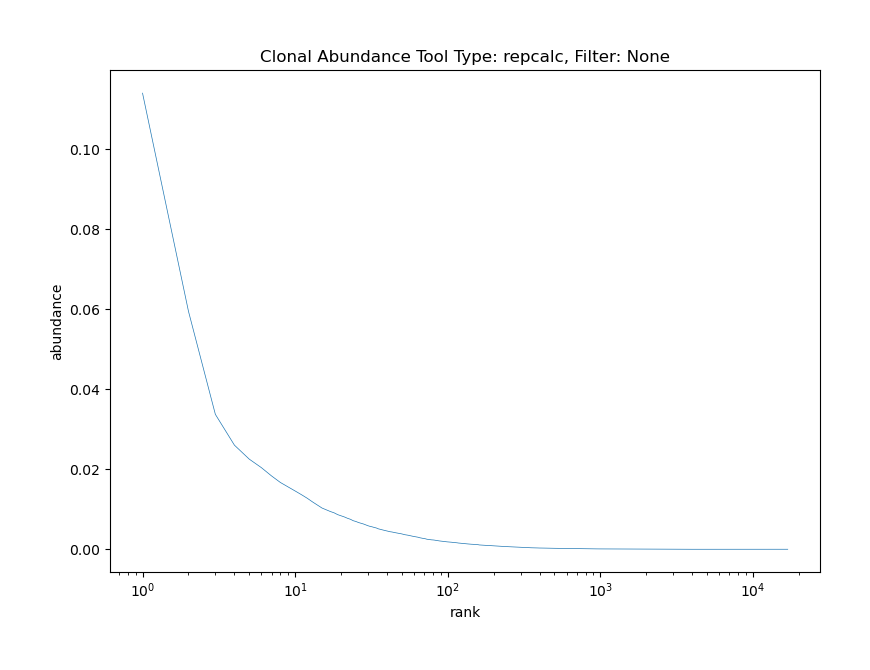

In [25]:
processing_stage = 'igblast.makedb.allele.clone'
clone_tool = 'repcalc' # repcalc, changeo
df = br.load_and_prepare_clonal_abundance_group_data(
    repcalc_dir,
    diag_hi_groups,
    all_groups=repertoire_groups,
    clone_tool=clone_tool,
    processing_stage=processing_stage
)

fig, ax = gr.plot_clonal_abundance(
    df,
    y_col = 'abundance',
    figsize=(8, 6),
    title = f'Clonal Abundance Tool Type: {clone_tool}, Filter: None',
    legend_title = None,
    hue=None
)
fig.show()


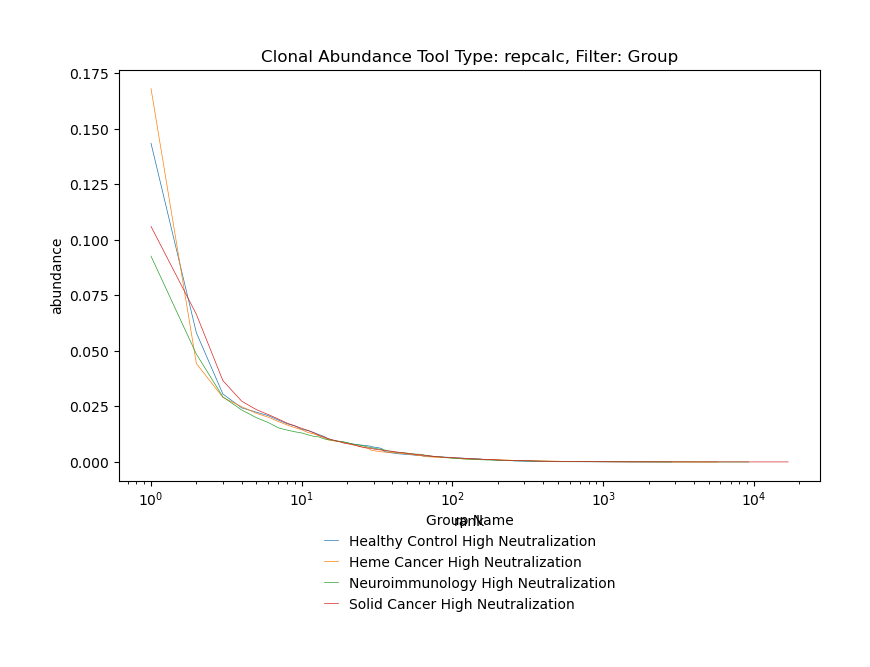

In [26]:
processing_stage = 'igblast.makedb.allele.clone'
clone_tool = 'repcalc' # repcalc, changeo
df = br.load_and_prepare_clonal_abundance_group_data(
    repcalc_dir,
    diag_hi_groups,
    all_groups=repertoire_groups,
    clone_tool=clone_tool,
    processing_stage=processing_stage
)

fig, ax = gr.plot_clonal_abundance(
    df,
    y_col = 'abundance',
    figsize=(8, 6),
    title = f'Clonal Abundance Tool Type: {clone_tool}, Filter: Group',
    legend_title = 'Group Name',
    hue='condition'
)
fig.show()

/tmp/ipykernel_3162441/1653643407.py:283: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.96])  # leave space for suptitle


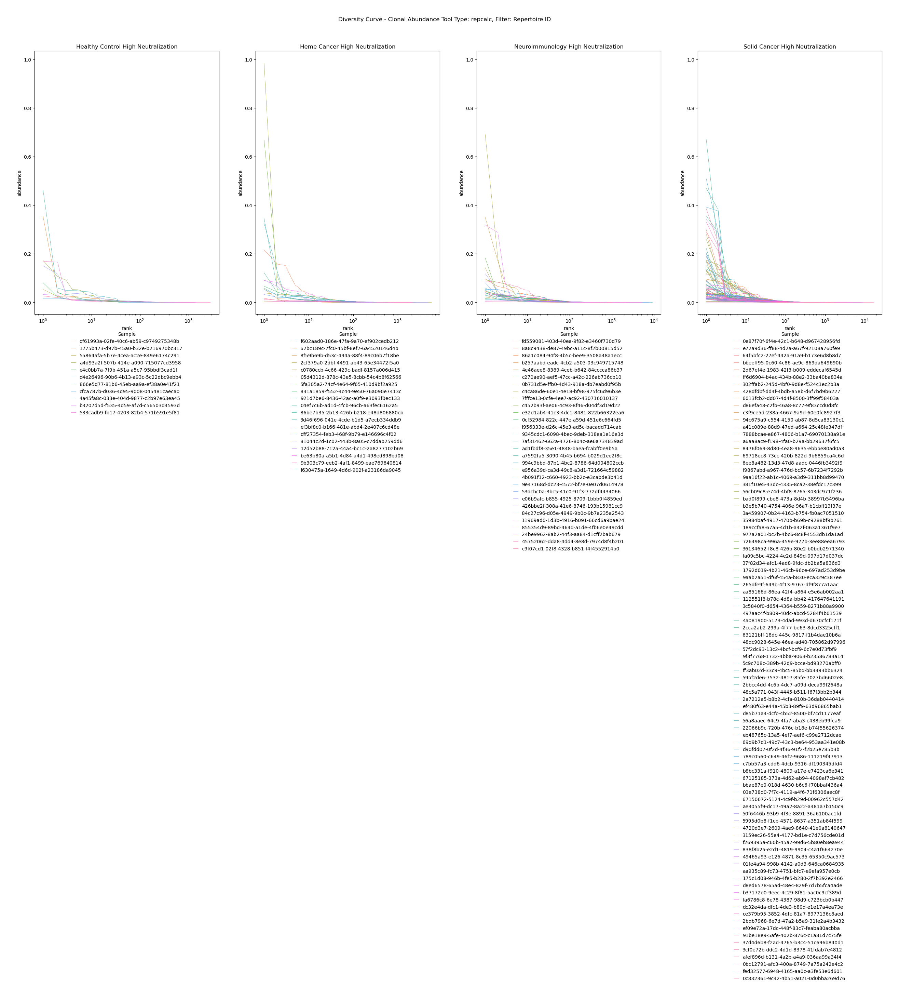

In [27]:
processing_stage = 'igblast.makedb.allele.clone'
clone_tool = 'repcalc' # repcalc, changeo
df = br.load_and_prepare_clonal_abundance_group_data(
    repcalc_dir,
    diag_hi_groups,
    all_groups=repertoire_groups,
    clone_tool=clone_tool,
    processing_stage=processing_stage
)

def plot1(ax):
    gr.plot_clonal_abundance(
        df[df['condition']==diag_hi_groups[0][1]],
        y_col = 'abundance',
        figsize=(8, 10),
        title = f'{diag_hi_groups[0][1]}',
        legend_title = 'Sample',
        hue='repertoire_id',
        ax=ax
    )

def plot2(ax):
    gr.plot_clonal_abundance(
        df[df['condition']==diag_hi_groups[1][1]],
        y_col = 'abundance',
        figsize=(8, 10),
        title = f'{diag_hi_groups[1][1]}',
        legend_title = 'Sample',
        hue='repertoire_id',
        ax=ax
    )

def plot3(ax):
    gr.plot_clonal_abundance(
        df[df['condition']==diag_hi_groups[2][1]],
        y_col = 'abundance',
        figsize=(8, 10),
        title = f'{diag_hi_groups[2][1]}',
        legend_title = 'Sample',
        hue='repertoire_id',
        ax=ax
    )

def plot4(ax):
    gr.plot_clonal_abundance(
        df[df['condition']==diag_hi_groups[3][1]],
        y_col = 'abundance',
        figsize=(8, 10),
        title = f'{diag_hi_groups[3][1]}',
        legend_title = 'Sample',
        hue='repertoire_id',
        ax=ax
    )

fig, axes = plot_four_horizontal_layout(plot1, plot2, plot3, plot4, figsize=(32,10), sharey=True)
fig.suptitle(f'Diversity Curve - Clonal Abundance Tool Type: {clone_tool}, Filter: Repertoire ID')
fig.show()

/tmp/ipykernel_3162441/1653643407.py:283: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 1, 0.96])  # leave space for suptitle


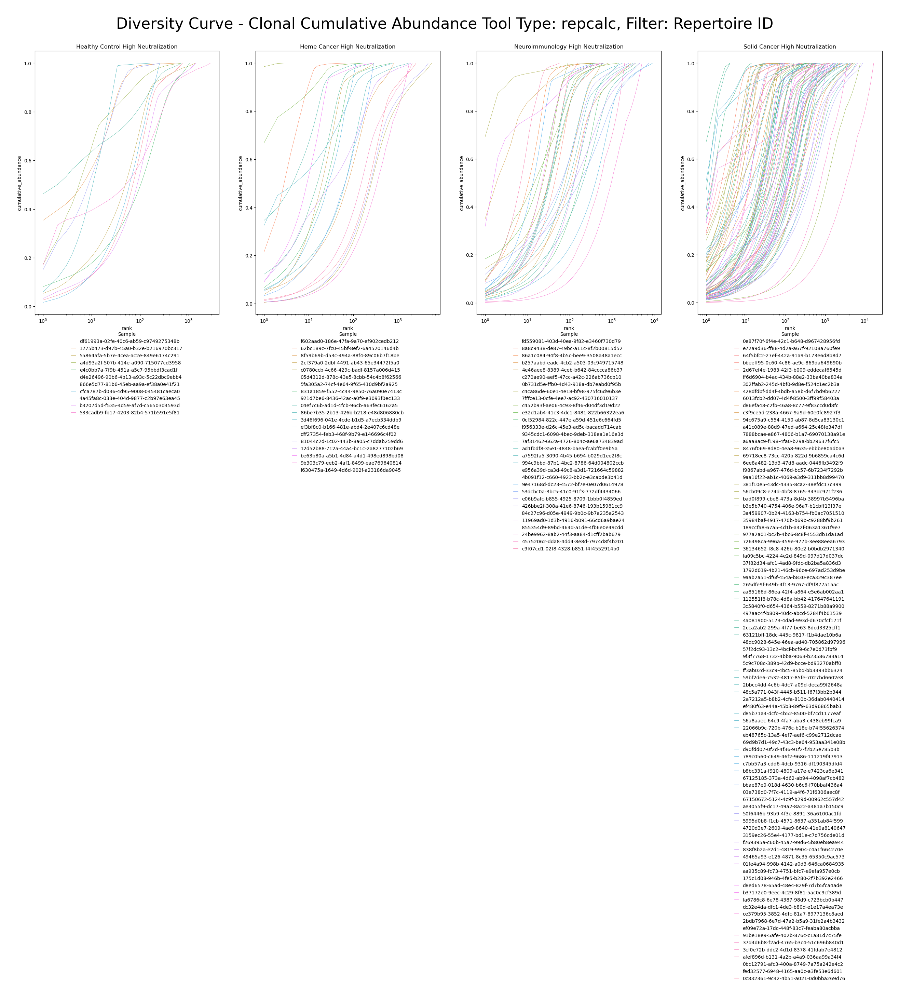

In [28]:
processing_stage = 'igblast.makedb.allele.clone'
clone_tool = 'repcalc' # repcalc, changeo
df = br.load_and_prepare_clonal_abundance_group_data(
    repcalc_dir,
    diag_hi_groups,
    all_groups=repertoire_groups,
    clone_tool=clone_tool,
    processing_stage=processing_stage
)

def plot1(ax):
    gr.plot_clonal_abundance(
        df[df['condition']==diag_hi_groups[0][1]],
        y_col = 'cumulative_abundance',
        figsize=(8, 10),
        title = f'{diag_hi_groups[0][1]}',
        legend_title = 'Sample',
        hue='repertoire_id',
        ax=ax
    )

def plot2(ax):
    gr.plot_clonal_abundance(
        df[df['condition']==diag_hi_groups[1][1]],
        y_col = 'cumulative_abundance',
        figsize=(8, 10),
        title = f'{diag_hi_groups[1][1]}',
        legend_title = 'Sample',
        hue='repertoire_id',
        ax=ax
    )

def plot3(ax):
    gr.plot_clonal_abundance(
        df[df['condition']==diag_hi_groups[2][1]],
        y_col = 'cumulative_abundance',
        figsize=(8, 10),
        title = f'{diag_hi_groups[2][1]}',
        legend_title = 'Sample',
        hue='repertoire_id',
        ax=ax
    )

def plot4(ax):
    gr.plot_clonal_abundance(
        df[df['condition']==diag_hi_groups[3][1]],
        y_col = 'cumulative_abundance',
        figsize=(8, 10),
        title = f'{diag_hi_groups[3][1]}',
        legend_title = 'Sample',
        hue='repertoire_id',
        ax=ax
    )

fig, axes = plot_four_horizontal_layout(plot1, plot2, plot3, plot4, figsize=(32,10))
fig.suptitle(f'Diversity Curve - Clonal Cumulative Abundance Tool Type: {clone_tool}, Filter: Repertoire ID', fontsize=32)
fig.show()

## Diversity

### Curves

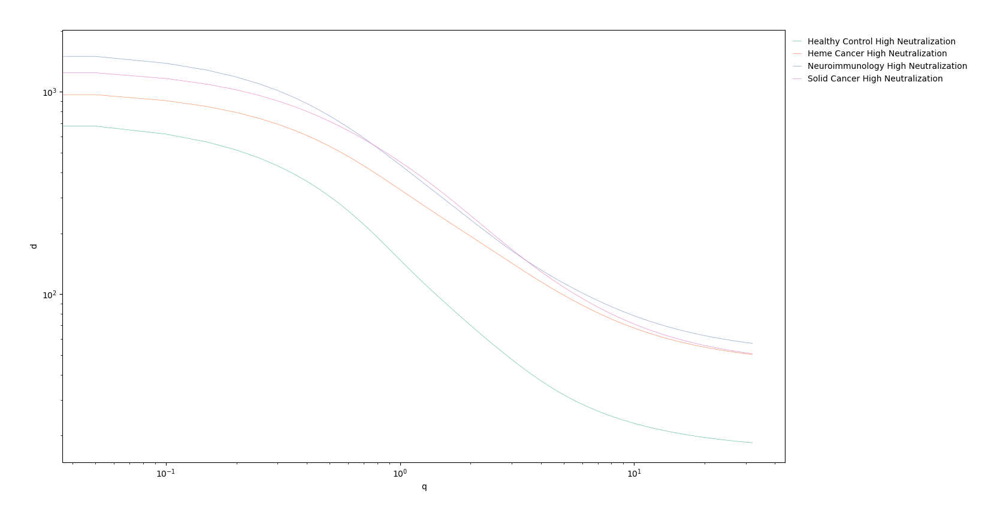

In [29]:
dfs = []
for i, (group_id, group_name, *_) in enumerate(diag_hi_groups):
        
    df = br.load_diversity_group_data(
        data_dir=repcalc_dir,
        repertoire_group=repertoire_groups[group_id],
        processing_stage='igblast.makedb.gene.clone'
    )
    dfs.append(df)
df = pd.concat(dfs)

fig, ax = gr.plot_diversity_curve(
    df=df
)

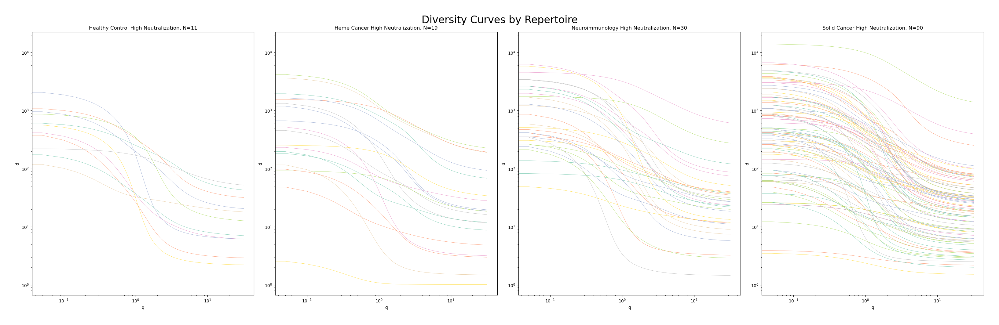

In [30]:
hue='repertoire_id'

dfs = []
for i, (group_id, group_name, n) in enumerate(diag_hi_groups):
        
    df = br.load_diversity_group_data(
        data_dir=repcalc_dir,
        repertoire_group=repertoire_groups[group_id],
        processing_stage='igblast.makedb.gene.clone'
    )
    dfs.append(df)
df = pd.concat(dfs)

def plot1(ax):
    group_name = diag_hi_groups[0][1]
    group_n = diag_hi_groups[0][2]
    gr.plot_diversity_curve(
        df=df[df['condition']==group_name].copy(),
        title=f'{group_name}, N={group_n}',
        hue=hue,
        ax=ax,
        legend=False
    )

def plot2(ax):
    group_name = diag_hi_groups[1][1]
    group_n = diag_hi_groups[1][2]
    gr.plot_diversity_curve(
        df=df[df['condition']==group_name].copy(),
        title=f'{group_name}, N={group_n}',
        hue=hue,
        ax=ax,
        legend=False
    )
    
def plot3(ax):
    group_name = diag_hi_groups[2][1]
    group_n = diag_hi_groups[2][2]
    gr.plot_diversity_curve(
        df=df[df['condition']==group_name].copy(),
        title=f'{group_name}, N={group_n}',
        hue=hue,
        ax=ax,
        legend=False
    )

def plot4(ax):
    group_name = diag_hi_groups[3][1]
    group_n = diag_hi_groups[3][2]
    ax = gr.plot_diversity_curve(
        df=df[df['condition']==group_name].copy(),
        title=f'{group_name}, N={group_n}',
        hue=hue,
        ax=ax,
        legend=False
    )

fig, axes = plot_four_horizontal_layout(plot1, plot2, plot3, plot4, figsize=(32,10), sharey=True)
fig.suptitle('Diversity Curves by Repertoire', fontsize=24)
fig.show()

### Boxplot - Normalized Shannon Entropy

calculate single number for each patient and create box and whisker. Number = normalized shannon entropy by pulling two values from curve. value at q=1/q=0 (double check)

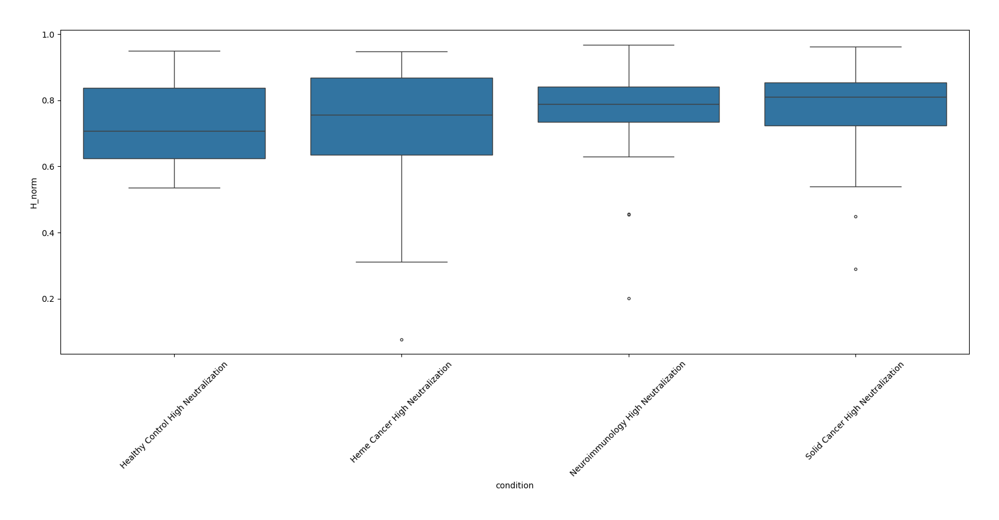

In [31]:
df = br.load_diversity_multiple_group_data(
    data_dir=repcalc_dir,
    repertoire_groups=diag_hi_groups,
    processing_stage='igblast.makedb.gene.clone',
    all_groups=repertoire_groups
)

fig, ax = gr.plot_diversity_boxplot(
    df=df,
    hue='condition',
    legend=False
)

fig.show()

## SHM Hedgehog plots

(<Figure size 1200x1200 with 4 Axes>,
 (<PolarAxes: title={'center': 'Healthy Control High Neutralization'}>,
  <PolarAxes: title={'center': 'Heme Cancer High Neutralization'}>,
  <PolarAxes: title={'center': 'Neuroimmunology High Neutralization'}>,
  <PolarAxes: title={'center': 'Solid Cancer High Neutralization'}>))

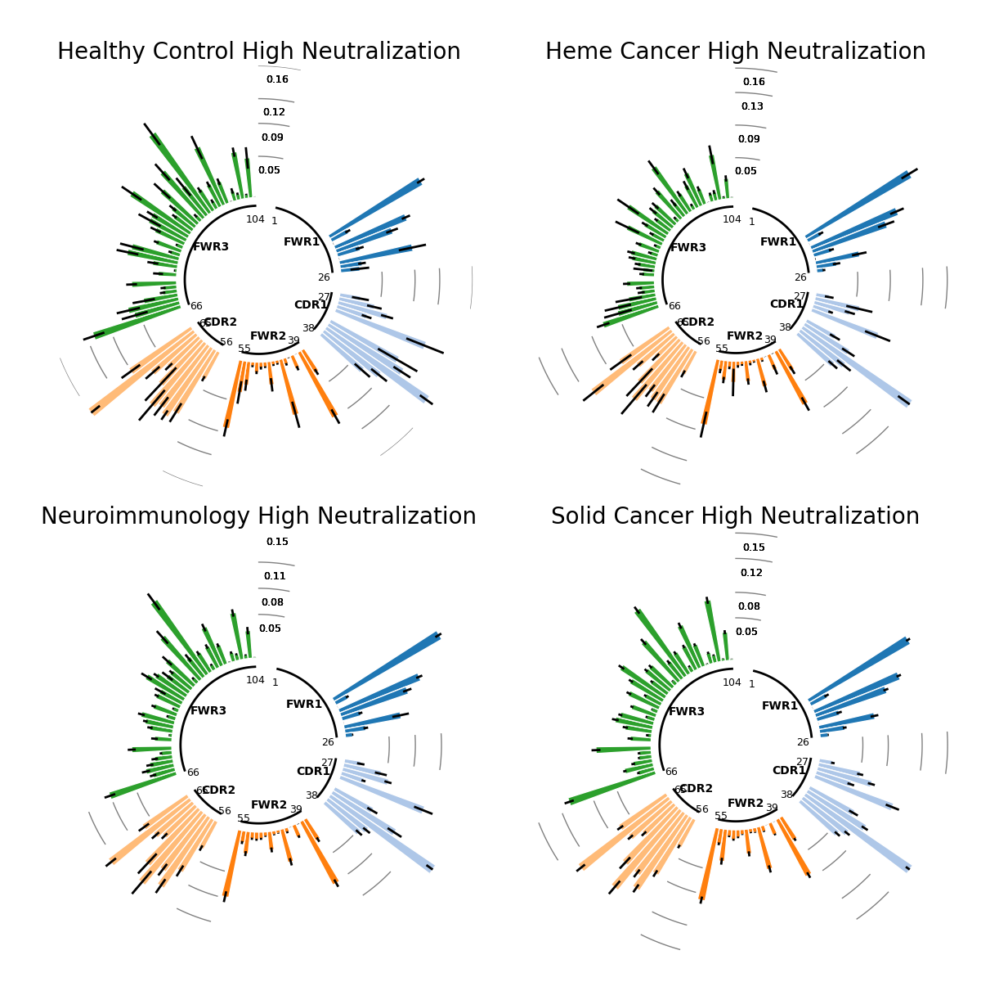

In [32]:
def plot_top_left(ax):
    df = br.load_and_prepare_mutation_data(
        mutation_data_dir=repcalc_dir,
        group_id=diag_hi_groups[0][0],
        trim_codons=16,
        processing_stage='igblast.makedb.gene.clone.mutations'
    )
    
    gr.plot_mutational_hedgehog(
        df=df,
        figsize=(12,12),
        title=f'{diag_hi_groups[0][1]}',
        ax=ax
    )
def plot_top_right(ax):
    df = br.load_and_prepare_mutation_data(
        mutation_data_dir=repcalc_dir,
        group_id=diag_hi_groups[1][0],
        trim_codons=16,
        processing_stage='igblast.makedb.gene.clone.mutations'
    )
    
    gr.plot_mutational_hedgehog(
        df=df,
        figsize=(12,12),
        title=f'{diag_hi_groups[1][1]}',
        ax=ax
    )
def plot_bottom_left(ax):
    df = br.load_and_prepare_mutation_data(
        mutation_data_dir=repcalc_dir,
        group_id=diag_hi_groups[2][0],
        trim_codons=16,
        processing_stage='igblast.makedb.gene.clone.mutations'
    )
    
    gr.plot_mutational_hedgehog(
        df=df,
        figsize=(12,12),
        title=f'{diag_hi_groups[2][1]}',
        ax=ax
    )
def plot_bottom_right(ax):
    df = br.load_and_prepare_mutation_data(
        mutation_data_dir=repcalc_dir,
        group_id=diag_hi_groups[3][0],
        trim_codons=16,
        processing_stage='igblast.makedb.gene.clone.mutations'
    )
    
    gr.plot_mutational_hedgehog(
        df=df,
        figsize=(12,12),
        title=f'{diag_hi_groups[3][1]}',
        ax=ax
    )

plot_two_by_two_layout(
    plot_top_left, 
    plot_top_right, 
    plot_bottom_left, 
    plot_bottom_right, 
    figsize=(12, 12), 
    sharey=False, 
    suptitle=None, 
    projection_top_left='polar',
    projection_top_right='polar',
    projection_bottom_left='polar',
    projection_bottom_right='polar')

In [33]:
# for group_id, group_name in diag_hi_groups:
#     df = br.load_and_prepare_mutation_data(
#         mutation_data_dir=repcalc_dir,
#         group_id=group_id,
#         trim_codons=16,
#         processing_stage='igblast.makedb.gene.clone.mutations'
#     )
#     # print(df)
#     fig, ax = gr.plot_mutational_hedgehog(
#         df=df,
#         figsize=(12,12),
#         title=f'Mutational HedgeHog for group: {group_name}',
#     )

#     fig.show()